In [ ]:
# https://www.researchgate.net/publication/392864746_Beyond_Fitzpatrick_automated_artificial_intelligence-based_skin_tone_analysis_in_dermatological_patients

In [1]:
# from insightface.app import FaceAnalysis
# from tqdm import tqdm
# import numpy as np
# import cv2
# import time
# from typing import List, Dict, Tuple, Optional
# from enum import Enum

# class SkinToneScale(Enum):
#     """Skin tone classification scales"""
#     FITZPATRICK = "fitzpatrick"
#     MONK = "monk"

# class SkinToneAnalyzer:
#     """
#     Analyzes skin tone from face images using ITA° (Individual Typology Angle)
#     based on "Beyond Fitzpatrick: automated artificial intelligence-based skin tone analysis"
#     """
    
#     # Fitzpatrick Scale ITA° thresholds (6 categories)
#     FITZPATRICK_THRESHOLDS = {
#         'I': (55, float('inf')),      # Very fair
#         'II': (41, 55),                # Fair
#         'III': (28, 41),               # Medium
#         'IV': (10, 28),                # Olive
#         'V': (-30, 10),                # Brown
#         'VI': (float('-inf'), -30)     # Dark brown/black
#     }
    
#     # Monk Skin Tone Scale ITA° thresholds (10 categories)
#     MONK_THRESHOLDS = {
#         '1': (50, float('inf')),
#         '2': (40, 50),
#         '3': (30, 40),
#         '4': (20, 30),
#         '5': (10, 20),
#         '6': (0, 10),
#         '7': (-10, 0),
#         '8': (-20, -10),
#         '9': (-30, -20),
#         '10': (float('-inf'), -30)
#     }
    
#     def __init__(self, scale: SkinToneScale = SkinToneScale.FITZPATRICK):
#         """
#         Initialize skin tone analyzer.
        
#         Args:
#             scale: Either FITZPATRICK or MONK scale
#         """
#         self.scale = scale
#         self.thresholds = (self.FITZPATRICK_THRESHOLDS if scale == SkinToneScale.FITZPATRICK 
#                           else self.MONK_THRESHOLDS)
    
#     def rgb_to_lab(self, rgb_image: np.ndarray) -> np.ndarray:
#         """
#         Convert RGB image to CIE L*a*b* color space.
        
#         Args:
#             rgb_image: RGB image (H, W, 3) with values 0-255
            
#         Returns:
#             LAB image (H, W, 3)
#         """
#         return cv2.cvtColor(rgb_image, cv2.COLOR_RGB2LAB)
    
#     def segment_skin(self, face_crop: np.ndarray, landmarks: np.ndarray = None) -> np.ndarray:
#         """
#         Segment skin pixels from face crop, excluding eyes, mouth, and hair.
#         Uses YCrCb color space for basic skin detection.
        
#         Args:
#             face_crop: RGB face image
#             landmarks: Optional facial landmarks for better segmentation
            
#         Returns:
#             Binary mask of skin pixels
#         """
#         # Convert to YCrCb color space for skin detection
#         ycrcb = cv2.cvtColor(face_crop, cv2.COLOR_RGB2YCrCb)
        
#         # Define skin color range in YCrCb (these are empirical values)
#         lower_skin = np.array([0, 133, 77], dtype=np.uint8)
#         upper_skin = np.array([255, 173, 127], dtype=np.uint8)
        
#         # Create initial skin mask
#         skin_mask = cv2.inRange(ycrcb, lower_skin, upper_skin)
        
#         # Apply morphological operations to clean up mask
#         kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
#         skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel)
#         skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)
        
#         # If landmarks are available, exclude eye and mouth regions
#         if landmarks is not None:
#             h, w = face_crop.shape[:2]
#             # Create exclusion mask for eyes and mouth (approximate regions)
#             # This is a simplified approach - can be refined with exact landmark positions
#             exclusion_mask = np.ones((h, w), dtype=np.uint8) * 255
            
#             # Exclude upper 1/3 for hair/forehead boundary
#             exclusion_mask[:int(h*0.15), :] = 0
            
#             skin_mask = cv2.bitwise_and(skin_mask, exclusion_mask)
        
#         return skin_mask
    
#     def calculate_ita(self, lab_image: np.ndarray, mask: np.ndarray = None) -> float:
#         """
#         Calculate Individual Typology Angle (ITA°) from LAB image.
#         ITA° = arctan((L* - 50) / b*) × 180/π
        
#         Args:
#             lab_image: Image in CIE L*a*b* color space
#             mask: Optional binary mask to specify which pixels to use
            
#         Returns:
#             ITA° value in degrees
#         """
#         if mask is not None:
#             # Extract only masked pixels
#             l_values = lab_image[:, :, 0][mask > 0]
#             b_values = lab_image[:, :, 2][mask > 0]
#         else:
#             l_values = lab_image[:, :, 0].flatten()
#             b_values = lab_image[:, :, 2].flatten()
        
#         if len(l_values) == 0:
#             return None
        
#         # Calculate mean L* and b*
#         mean_l = np.mean(l_values)
#         mean_b = np.mean(b_values)
        
#         # Calculate ITA°
#         ita = np.arctan2((mean_l - 50), mean_b) * (180 / np.pi)
        
#         return ita
    
#     def classify_skin_tone(self, ita: float) -> str:
#         """
#         Classify skin tone based on ITA° value.
        
#         Args:
#             ita: Individual Typology Angle in degrees
            
#         Returns:
#             Skin tone category (Fitzpatrick I-VI or Monk 1-10)
#         """
#         if ita is None:
#             return "Unknown"
        
#         for category, (lower, upper) in self.thresholds.items():
#             if lower <= ita < upper:
#                 return category
        
#         return "Unknown"
    
#     def analyze_face(self, image: np.ndarray, bbox: List[int], 
#                     landmarks: np.ndarray = None) -> Dict:
#         """
#         Analyze skin tone for a single detected face.
        
#         Args:
#             image: Full RGB image
#             bbox: Bounding box [x1, y1, x2, y2]
#             landmarks: Optional facial landmarks
            
#         Returns:
#             Dictionary with skin tone analysis results
#         """
#         x1, y1, x2, y2 = [int(coord) for coord in bbox]
        
#         # Extract face crop
#         face_crop = image[y1:y2, x1:x2]
        
#         if face_crop.size == 0:
#             return {
#                 'ita': None,
#                 'skin_tone_category': 'Unknown',
#                 'scale': self.scale.value,
#                 'error': 'Invalid face crop'
#             }
        
#         # Segment skin pixels
#         skin_mask = self.segment_skin(face_crop, landmarks)
        
#         # Convert to LAB color space
#         lab_image = self.rgb_to_lab(face_crop)
        
#         # Calculate ITA°
#         ita = self.calculate_ita(lab_image, skin_mask)
        
#         # Classify skin tone
#         category = self.classify_skin_tone(ita)
        
#         return {
#             'ita': float(ita) if ita is not None else None,
#             'skin_tone_category': category,
#             'scale': self.scale.value,
#             'mean_L': float(np.mean(lab_image[:, :, 0][skin_mask > 0])) if ita is not None else None,
#             'mean_b': float(np.mean(lab_image[:, :, 2][skin_mask > 0])) if ita is not None else None
#         }


# def evaluate_scrfd_with_skin_tone(dataset, 
#                                    confidence_threshold: float = 0.5,
#                                    batch_size: int = 32,
#                                    ctx_id: int = 0,
#                                    save_filenames: bool = False,
#                                    skin_tone_scale: SkinToneScale = SkinToneScale.FITZPATRICK):
#     """
#     Evaluate SCRFD detector with skin tone analysis for each detected face.
    
#     Args:
#         dataset: Hugging Face dataset containing 'image' and 'faces' fields
#         confidence_threshold: Minimum score for face detection
#         batch_size: Number of images to process in a batch
#         ctx_id: GPU index (0,1,...) or -1 for CPU
#         save_filenames: If True, stores image filenames
#         skin_tone_scale: Either FITZPATRICK or MONK scale
        
#     Returns:
#         preds: List of dicts with boxes, scores, and skin_tones
#         gts: List of ground-truth bounding boxes
#         inference_times: List of per-image inference times
#     """
#     # Initialize SCRFD detector
#     app = FaceAnalysis(allowed_modules=['detection'])
#     app.prepare(ctx_id=ctx_id, det_thresh=confidence_threshold)
    
#     # Initialize skin tone analyzer
#     skin_analyzer = SkinToneAnalyzer(scale=skin_tone_scale)
    
#     # Convert dataset to list
#     images = [np.array(sample['image'].convert('RGB')) for sample in dataset]
#     gts = [sample['faces']['bbox'] for sample in dataset]
#     image_names = [sample['image'].filename if save_filenames else None for sample in dataset]
    
#     preds = []
#     inference_times = []
    
#     for i in tqdm(range(0, len(images), batch_size), desc="Evaluating SCRFD + Skin Tone", unit="batch"):
#         batch_imgs = images[i:i+batch_size]
#         batch_names = image_names[i:i+batch_size] if save_filenames else [None]*len(batch_imgs)
        
#         start = time.time()
#         batch_faces = [app.get(img) for img in batch_imgs]
#         batch_time = time.time() - start
        
#         per_image_time = batch_time / len(batch_imgs)
        
#         for img, faces, img_name in zip(batch_imgs, batch_faces, batch_names):
#             boxes, scores, skin_tones = [], [], []
            
#             for face in faces:
#                 if face.det_score >= confidence_threshold:
#                     x1, y1, x2, y2 = face.bbox.astype(int)
#                     boxes.append([int(x1), int(y1), int(x2 - x1), int(y2 - y1)])
#                     scores.append(face.det_score)
                    
#                     # Analyze skin tone for this face
#                     landmarks = face.kps if hasattr(face, 'kps') else None
#                     skin_tone_result = skin_analyzer.analyze_face(
#                         img, 
#                         [x1, y1, x2, y2],
#                         landmarks
#                     )
#                     skin_tones.append(skin_tone_result)
            
#             pred_dict = {
#                 'boxes': boxes,
#                 'scores': scores,
#                 'skin_tones': skin_tones
#             }
            
#             if save_filenames:
#                 pred_dict['image_name'] = img_name
            
#             preds.append(pred_dict)
#             inference_times.append(per_image_time)
    
#     return preds, gts, inference_times

c:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# from insightface.app import FaceAnalysis
# from tqdm import tqdm
# import numpy as np
# import cv2
# import time
# from typing import List, Dict, Tuple, Optional
# from enum import Enum

# class SkinToneScale(Enum):
#     """Skin tone classification scales"""
#     FITZPATRICK = "fitzpatrick"
#     MONK = "monk"

# class SkinToneAnalyzer:
#     """
#     Analyzes skin tone from face images using ITA° (Individual Typology Angle)
#     based on "Beyond Fitzpatrick: automated artificial intelligence-based skin tone analysis"
#     """
    
#     # Fitzpatrick Scale ITA° thresholds (6 categories)
#     FITZPATRICK_THRESHOLDS = {
#         'I': (55, float('inf')),      # Very fair
#         'II': (41, 55),                # Fair
#         'III': (28, 41),               # Medium
#         'IV': (10, 28),                # Olive
#         'V': (-30, 10),                # Brown
#         'VI': (float('-inf'), -30)     # Dark brown/black
#     }
    
#     # Monk Skin Tone Scale ITA° thresholds (10 categories)
#     MONK_THRESHOLDS = {
#         '1': (50, float('inf')),
#         '2': (40, 50),
#         '3': (30, 40),
#         '4': (20, 30),
#         '5': (10, 20),
#         '6': (0, 10),
#         '7': (-10, 0),
#         '8': (-20, -10),
#         '9': (-30, -20),
#         '10': (float('-inf'), -30)
#     }
    
#     def __init__(self, scale: SkinToneScale = SkinToneScale.FITZPATRICK):
#         """
#         Initialize skin tone analyzer.
        
#         Args:
#             scale: Either FITZPATRICK or MONK scale
#         """
#         self.scale = scale
#         self.thresholds = (self.FITZPATRICK_THRESHOLDS if scale == SkinToneScale.FITZPATRICK 
#                           else self.MONK_THRESHOLDS)
    
#     def rgb_to_lab(self, rgb_image: np.ndarray) -> np.ndarray:
#         """
#         Convert RGB image to CIE L*a*b* color space.
        
#         Args:
#             rgb_image: RGB image (H, W, 3) with values 0-255
            
#         Returns:
#             LAB image (H, W, 3)
#         """
#         return cv2.cvtColor(rgb_image, cv2.COLOR_RGB2LAB)
    
#     def segment_skin(self, face_crop: np.ndarray, landmarks: np.ndarray = None) -> np.ndarray:
#         """
#         Segment skin pixels from face crop, excluding eyes, mouth, and hair.
#         Uses multiple color spaces for robust skin detection.
        
#         Args:
#             face_crop: RGB face image
#             landmarks: Optional facial landmarks for better segmentation
            
#         Returns:
#             Binary mask of skin pixels
#         """
#         if face_crop.size == 0 or face_crop.shape[0] < 10 or face_crop.shape[1] < 10:
#             return np.zeros(face_crop.shape[:2], dtype=np.uint8)
        
#         h, w = face_crop.shape[:2]
        
#         # Method 1: YCrCb color space
#         ycrcb = cv2.cvtColor(face_crop, cv2.COLOR_RGB2YCrCb)
#         lower_skin = np.array([0, 133, 77], dtype=np.uint8)
#         upper_skin = np.array([255, 173, 127], dtype=np.uint8)
#         mask1 = cv2.inRange(ycrcb, lower_skin, upper_skin)
        
#         # Method 2: HSV color space (more robust for varying lighting)
#         hsv = cv2.cvtColor(face_crop, cv2.COLOR_RGB2HSV)
#         lower_hsv = np.array([0, 20, 70], dtype=np.uint8)
#         upper_hsv = np.array([20, 150, 255], dtype=np.uint8)
#         mask2 = cv2.inRange(hsv, lower_hsv, upper_hsv)
        
#         # Combine both masks
#         skin_mask = cv2.bitwise_or(mask1, mask2)
        
#         # Apply morphological operations to clean up mask
#         kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
#         skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
#         skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)
        
#         # Exclude top 15% (hair/forehead boundary) and bottom 10% (potential neck/shadow)
#         exclusion_mask = np.ones((h, w), dtype=np.uint8) * 255
#         exclusion_mask[:int(h*0.15), :] = 0
#         exclusion_mask[int(h*0.9):, :] = 0
        
#         # Focus on center region (cheeks) for more reliable skin tone
#         center_mask = np.zeros((h, w), dtype=np.uint8)
#         center_h_start = int(h * 0.25)
#         center_h_end = int(h * 0.75)
#         center_w_start = int(w * 0.2)
#         center_w_end = int(w * 0.8)
#         center_mask[center_h_start:center_h_end, center_w_start:center_w_end] = 255
        
#         # Combine masks
#         skin_mask = cv2.bitwise_and(skin_mask, exclusion_mask)
#         skin_mask = cv2.bitwise_and(skin_mask, center_mask)
        
#         return skin_mask
    
#     def calculate_ita(self, lab_image: np.ndarray, mask: np.ndarray = None) -> Optional[float]:
#         """
#         Calculate Individual Typology Angle (ITA°) from LAB image.
#         ITA° = arctan((L* - 50) / b*) × 180/π
        
#         Args:
#             lab_image: Image in CIE L*a*b* color space
#             mask: Optional binary mask to specify which pixels to use
            
#         Returns:
#             ITA° value in degrees, or None if insufficient valid pixels
#         """
#         if mask is not None:
#             # Extract only masked pixels
#             l_values = lab_image[:, :, 0][mask > 0]
#             b_values = lab_image[:, :, 2][mask > 0]
#         else:
#             l_values = lab_image[:, :, 0].flatten()
#             b_values = lab_image[:, :, 2].flatten()
        
#         # Need at least 100 pixels for reliable measurement
#         if len(l_values) < 100:
#             return None
        
#         # Calculate mean L* and b*
#         mean_l = np.mean(l_values)
#         mean_b = np.mean(b_values)
        
#         # Calculate ITA°
#         # Handle edge case where mean_b is very close to 0
#         if abs(mean_b) < 0.01:
#             mean_b = 0.01
        
#         ita = np.arctan2((mean_l - 50), mean_b) * (180 / np.pi)
        
#         return float(ita)
    
#     def classify_skin_tone(self, ita: float) -> str:
#         """
#         Classify skin tone based on ITA° value.
        
#         Args:
#             ita: Individual Typology Angle in degrees
            
#         Returns:
#             Skin tone category (Fitzpatrick I-VI or Monk 1-10)
#         """
#         if ita is None:
#             return "Unknown"
        
#         for category, (lower, upper) in self.thresholds.items():
#             if lower <= ita < upper:
#                 return category
        
#         return "Unknown"
    
#     def analyze_face(self, image: np.ndarray, bbox: List[int], 
#                     landmarks: np.ndarray = None) -> Dict:
#         """
#         Analyze skin tone for a single detected face.
        
#         Args:
#             image: Full RGB image
#             bbox: Bounding box [x1, y1, x2, y2]
#             landmarks: Optional facial landmarks
            
#         Returns:
#             Dictionary with skin tone analysis results
#         """
#         x1, y1, x2, y2 = [int(coord) for coord in bbox]
        
#         # Validate bounding box
#         h_img, w_img = image.shape[:2]
#         x1 = max(0, min(x1, w_img))
#         y1 = max(0, min(y1, h_img))
#         x2 = max(0, min(x2, w_img))
#         y2 = max(0, min(y2, h_img))
        
#         # Extract face crop
#         face_crop = image[y1:y2, x1:x2]
        
#         if face_crop.size == 0 or face_crop.shape[0] < 10 or face_crop.shape[1] < 10:
#             return {
#                 'ita': None,
#                 'skin_tone_category': 'Unknown',
#                 'scale': self.scale.value,
#                 'error': 'Invalid face crop (too small or empty)',
#                 'mean_L': None,
#                 'mean_b': None
#             }
        
#         try:
#             # Segment skin pixels
#             skin_mask = self.segment_skin(face_crop, landmarks)
            
#             # Check if we have enough skin pixels
#             skin_pixel_count = np.sum(skin_mask > 0)
#             if skin_pixel_count < 100:
#                 return {
#                     'ita': None,
#                     'skin_tone_category': 'Unknown',
#                     'scale': self.scale.value,
#                     'error': f'Insufficient skin pixels detected ({skin_pixel_count})',
#                     'mean_L': None,
#                     'mean_b': None
#                 }
            
#             # Convert to LAB color space
#             lab_image = self.rgb_to_lab(face_crop)
            
#             # Calculate ITA°
#             ita = self.calculate_ita(lab_image, skin_mask)
            
#             if ita is None:
#                 return {
#                     'ita': None,
#                     'skin_tone_category': 'Unknown',
#                     'scale': self.scale.value,
#                     'error': 'Failed to calculate ITA',
#                     'mean_L': None,
#                     'mean_b': None
#                 }
            
#             # Classify skin tone
#             category = self.classify_skin_tone(ita)
            
#             # Calculate mean L* and b* for the result
#             mean_L = float(np.mean(lab_image[:, :, 0][skin_mask > 0]))
#             mean_b = float(np.mean(lab_image[:, :, 2][skin_mask > 0]))
            
#             return {
#                 'ita': ita,
#                 'skin_tone_category': category,
#                 'scale': self.scale.value,
#                 'mean_L': mean_L,
#                 'mean_b': mean_b,
#                 'skin_pixels': int(skin_pixel_count)
#             }
            
#         except Exception as e:
#             return {
#                 'ita': None,
#                 'skin_tone_category': 'Unknown',
#                 'scale': self.scale.value,
#                 'error': f'Exception during analysis: {str(e)}',
#                 'mean_L': None,
#                 'mean_b': None
#             }


# def evaluate_scrfd_with_skin_tone(dataset, 
#                                    confidence_threshold: float = 0.5,
#                                    batch_size: int = 32,
#                                    ctx_id: int = 0,
#                                    save_filenames: bool = False,
#                                    skin_tone_scale: SkinToneScale = SkinToneScale.FITZPATRICK):
#     """
#     Evaluate SCRFD detector with skin tone analysis for each detected face.
    
#     Args:
#         dataset: Hugging Face dataset containing 'image' and 'faces' fields
#         confidence_threshold: Minimum score for face detection
#         batch_size: Number of images to process in a batch
#         ctx_id: GPU index (0,1,...) or -1 for CPU
#         save_filenames: If True, stores image filenames
#         skin_tone_scale: Either FITZPATRICK or MONK scale
        
#     Returns:
#         preds: List of dicts with boxes, scores, and skin_tones
#         gts: List of ground-truth bounding boxes
#         inference_times: List of per-image inference times
#     """
#     # Initialize SCRFD detector
#     app = FaceAnalysis(allowed_modules=['detection'])
#     app.prepare(ctx_id=ctx_id, det_thresh=confidence_threshold)
    
#     # Initialize skin tone analyzer
#     skin_analyzer = SkinToneAnalyzer(scale=skin_tone_scale)
    
#     # Convert dataset to list
#     images = [np.array(sample['image'].convert('RGB')) for sample in dataset]
#     gts = [sample['faces']['bbox'] for sample in dataset]
#     image_names = [sample['image'].filename if save_filenames else None for sample in dataset]
    
#     preds = []
#     inference_times = []
    
#     for i in tqdm(range(0, len(images), batch_size), desc="Evaluating SCRFD + Skin Tone", unit="batch"):
#         batch_imgs = images[i:i+batch_size]
#         batch_names = image_names[i:i+batch_size] if save_filenames else [None]*len(batch_imgs)
        
#         start = time.time()
#         batch_faces = [app.get(img) for img in batch_imgs]
#         batch_time = time.time() - start
        
#         per_image_time = batch_time / len(batch_imgs)
        
#         for img, faces, img_name in zip(batch_imgs, batch_faces, batch_names):
#             boxes, scores, skin_tones = [], [], []
            
#             for face in faces:
#                 if face.det_score >= confidence_threshold:
#                     x1, y1, x2, y2 = face.bbox.astype(int)
#                     boxes.append([int(x1), int(y1), int(x2 - x1), int(y2 - y1)])
#                     scores.append(face.det_score)
                    
#                     # Analyze skin tone for this face
#                     landmarks = face.kps if hasattr(face, 'kps') else None
#                     skin_tone_result = skin_analyzer.analyze_face(
#                         img, 
#                         [x1, y1, x2, y2],
#                         landmarks
#                     )
#                     skin_tones.append(skin_tone_result)
            
#             pred_dict = {
#                 'boxes': boxes,
#                 'scores': scores,
#                 'skin_tones': skin_tones
#             }
            
#             if save_filenames:
#                 pred_dict['image_name'] = img_name
            
#             preds.append(pred_dict)
#             inference_times.append(per_image_time)
    
#     return preds, gts, inference_times

In [10]:
from insightface.app import FaceAnalysis
from tqdm import tqdm
import numpy as np
import cv2
import time
from typing import List, Dict, Tuple, Optional
from enum import Enum

class SkinToneScale(Enum):
    """Skin tone classification scales"""
    FITZPATRICK = "fitzpatrick"
    MONK = "monk"

class SkinToneAnalyzer:
    """
    Analyzes skin tone from face images using ITA° (Individual Typology Angle)
    based on "Beyond Fitzpatrick: automated artificial intelligence-based skin tone analysis"
    """
    
    # Fitzpatrick Scale ITA° thresholds (6 categories)
    FITZPATRICK_THRESHOLDS = {
        'I': (55, float('inf')),      # Very fair
        'II': (41, 55),                # Fair
        'III': (28, 41),               # Medium
        'IV': (10, 28),                # Olive
        'V': (-30, 10),                # Brown
        'VI': (float('-inf'), -30)     # Dark brown/black
    }
    
    # Monk Skin Tone Scale ITA° thresholds (10 categories)
    # MONK_THRESHOLDS = {
    #     '1': (50, float('inf')),
    #     '2': (40, 50),
    #     '3': (30, 40),
    #     '4': (20, 30),
    #     '5': (10, 20),
    #     '6': (0, 10),
    #     '7': (-10, 0),
    #     '8': (-20, -10),
    #     '9': (-30, -20),
    #     '10': (float('-inf'), -30)
    # }

    MONK_THRESHOLDS = {
        # MST 1 (Lightest) - Use 100 as the maximum (as per the table)
        '1': (81.62, 100.0), 

        # MST 2
        '2': (75.99, 81.62),
        
        # MST 3
        '3': (68.24, 75.99),
        
        # MST 4
        '4': (57.53, 68.24),
        
        # MST 5
        '5': (30.61, 57.53),
        
        # MST 6
        '6': (-4.63, 30.61),
        
        # MST 7
        '7': (-37.77, -4.63),
        
        # MST 8
        '8': (-66.87, -37.77),
        
        # MST 9
        '9': (-81.33, -66.87),
        
        # MST 10 (Darkest) - Use -100.00 as the minimum (as per the table)
        '10': (-100.00, -81.33) 
    }
    
    def __init__(self, scale: SkinToneScale = SkinToneScale.FITZPATRICK):
        """
        Initialize skin tone analyzer.
        
        Args:
            scale: Either FITZPATRICK or MONK scale
        """
        self.scale = scale
        self.thresholds = (self.FITZPATRICK_THRESHOLDS if scale == SkinToneScale.FITZPATRICK 
                          else self.MONK_THRESHOLDS)
    
    def rgb_to_lab(self, rgb_image: np.ndarray) -> np.ndarray:
        """
        Convert RGB image to CIE L*a*b* color space.
        
        Args:
            rgb_image: RGB image (H, W, 3) with values 0-255
            
        Returns:
            LAB image (H, W, 3)
        """
        return cv2.cvtColor(rgb_image, cv2.COLOR_RGB2LAB)
    
    def segment_skin(self, face_crop: np.ndarray, landmarks: np.ndarray = None) -> np.ndarray:
        """
        Segment skin pixels from face crop, excluding eyes, mouth, and hair.
        Uses multiple color spaces for robust skin detection.
        
        Args:
            face_crop: RGB face image
            landmarks: Optional facial landmarks for better segmentation
            
        Returns:
            Binary mask of skin pixels
        """
        if face_crop.size == 0 or face_crop.shape[0] < 10 or face_crop.shape[1] < 10:
            return np.zeros(face_crop.shape[:2], dtype=np.uint8)
        
        h, w = face_crop.shape[:2]
        
        # Method 1: YCrCb color space
        ycrcb = cv2.cvtColor(face_crop, cv2.COLOR_RGB2YCrCb)
        lower_skin = np.array([0, 133, 77], dtype=np.uint8)
        upper_skin = np.array([255, 173, 127], dtype=np.uint8)
        mask1 = cv2.inRange(ycrcb, lower_skin, upper_skin)
        
        # Method 2: HSV color space (more robust for varying lighting)
        hsv = cv2.cvtColor(face_crop, cv2.COLOR_RGB2HSV)
        lower_hsv = np.array([0, 20, 70], dtype=np.uint8)
        upper_hsv = np.array([20, 150, 255], dtype=np.uint8)
        mask2 = cv2.inRange(hsv, lower_hsv, upper_hsv)
        
        # Combine both masks
        skin_mask = cv2.bitwise_or(mask1, mask2)
        
        # Apply morphological operations to clean up mask
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
        skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)
        
        # Exclude top 15% (hair/forehead boundary) and bottom 10% (potential neck/shadow)
        exclusion_mask = np.ones((h, w), dtype=np.uint8) * 255
        exclusion_mask[:int(h*0.15), :] = 0
        exclusion_mask[int(h*0.9):, :] = 0
        
        # Focus on center region (cheeks) for more reliable skin tone
        center_mask = np.zeros((h, w), dtype=np.uint8)
        center_h_start = int(h * 0.25)
        center_h_end = int(h * 0.75)
        center_w_start = int(w * 0.2)
        center_w_end = int(w * 0.8)
        center_mask[center_h_start:center_h_end, center_w_start:center_w_end] = 255
        
        # Combine masks
        skin_mask = cv2.bitwise_and(skin_mask, exclusion_mask)
        skin_mask = cv2.bitwise_and(skin_mask, center_mask)
        
        return skin_mask
    
    def calculate_ita(self, lab_image: np.ndarray, mask: np.ndarray = None) -> Optional[float]:
        """
        Calculate Individual Typology Angle (ITA°) from LAB image.
        ITA° = arctan((L* - 50) / b*) × 180/π
        
        Args:
            lab_image: Image in CIE L*a*b* color space
            mask: Optional binary mask to specify which pixels to use
            
        Returns:
            ITA° value in degrees, or None if insufficient valid pixels
        """
        if mask is not None:
            # Extract only masked pixels
            l_values = lab_image[:, :, 0][mask > 0]
            b_values = lab_image[:, :, 2][mask > 0]
        else:
            l_values = lab_image[:, :, 0].flatten()
            b_values = lab_image[:, :, 2].flatten()
        
        # Need at least 100 pixels for reliable measurement
        if len(l_values) < 100:
            return None
        
        # Calculate mean L* and b*
        mean_l = np.mean(l_values)
        mean_b = np.mean(b_values)
        
        # Calculate ITA°
        # Handle edge case where mean_b is very close to 0
        if abs(mean_b) < 0.01:
            mean_b = 0.01
        
        ita = np.arctan2((mean_l - 50), mean_b) * (180 / np.pi)
        
        return float(ita)
    
    def classify_skin_tone(self, ita: float) -> str:
        """
        Classify skin tone based on ITA° value.
        
        Args:
            ita: Individual Typology Angle in degrees
            
        Returns:
            Skin tone category (Fitzpatrick I-VI or Monk 1-10)
        """
        if ita is None:
            return "Unknown"
        
        for category, (lower, upper) in self.thresholds.items():
            if lower <= ita < upper:
                return category
        
        return "Unknown"
    
    def analyze_face(self, image: np.ndarray, bbox: List[int], 
                    landmarks: np.ndarray = None) -> Dict:
        """
        Analyze skin tone for a single detected face.
        
        Args:
            image: Full RGB image
            bbox: Bounding box [x1, y1, x2, y2]
            landmarks: Optional facial landmarks
            
        Returns:
            Dictionary with skin tone analysis results
        """
        x1, y1, x2, y2 = [int(coord) for coord in bbox]
        
        # Validate bounding box
        h_img, w_img = image.shape[:2]
        x1 = max(0, min(x1, w_img))
        y1 = max(0, min(y1, h_img))
        x2 = max(0, min(x2, w_img))
        y2 = max(0, min(y2, h_img))
        
        # Extract face crop
        face_crop = image[y1:y2, x1:x2]
        
        if face_crop.size == 0 or face_crop.shape[0] < 10 or face_crop.shape[1] < 10:
            return {
                'ita': None,
                'skin_tone_category': 'Unknown',
                'scale': self.scale.value,
                'error': 'Invalid face crop (too small or empty)',
                'mean_L': None,
                'mean_b': None
            }
        
        try:
            # Segment skin pixels
            skin_mask = self.segment_skin(face_crop, landmarks)
            
            # Check if we have enough skin pixels
            skin_pixel_count = np.sum(skin_mask > 0)
            if skin_pixel_count < 100:
                return {
                    'ita': None,
                    'skin_tone_category': 'Unknown',
                    'scale': self.scale.value,
                    'error': f'Insufficient skin pixels detected ({skin_pixel_count})',
                    'mean_L': None,
                    'mean_b': None
                }
            
            # Convert to LAB color space
            lab_image = self.rgb_to_lab(face_crop)
            
            # Calculate ITA°
            ita = self.calculate_ita(lab_image, skin_mask)
            
            if ita is None:
                return {
                    'ita': None,
                    'skin_tone_category': 'Unknown',
                    'scale': self.scale.value,
                    'error': 'Failed to calculate ITA',
                    'mean_L': None,
                    'mean_b': None
                }
            
            # Classify skin tone
            category = self.classify_skin_tone(ita)
            
            # Calculate mean L* and b* for the result
            mean_L = float(np.mean(lab_image[:, :, 0][skin_mask > 0]))
            mean_b = float(np.mean(lab_image[:, :, 2][skin_mask > 0]))
            
            return {
                'ita': ita,
                'skin_tone_category': category,
                'scale': self.scale.value,
                'mean_L': mean_L,
                'mean_b': mean_b,
                'skin_pixels': int(skin_pixel_count)
            }
            
        except Exception as e:
            return {
                'ita': None,
                'skin_tone_category': 'Unknown',
                'scale': self.scale.value,
                'error': f'Exception during analysis: {str(e)}',
                'mean_L': None,
                'mean_b': None
            }


def evaluate_scrfd_with_skin_tone(dataset, 
                                   confidence_threshold: float = 0.5,
                                   batch_size: int = 32,
                                   ctx_id: int = 0,
                                   save_filenames: bool = False,
                                   skin_tone_scale: SkinToneScale = SkinToneScale.FITZPATRICK):
    """
    Evaluate SCRFD detector with skin tone analysis for each detected face.
    
    Args:
        dataset: Hugging Face dataset containing 'image' and 'faces' fields
        confidence_threshold: Minimum score for face detection
        batch_size: Number of images to process in a batch
        ctx_id: GPU index (0,1,...) or -1 for CPU
        save_filenames: If True, stores image filenames
        skin_tone_scale: Either FITZPATRICK or MONK scale
        
    Returns:
        preds: List of dicts with boxes, scores, and skin_tones
        gts: List of ground-truth bounding boxes
        inference_times: List of per-image inference times
    """
    # Initialize SCRFD detector
    app = FaceAnalysis(allowed_modules=['detection'])
    app.prepare(ctx_id=ctx_id, det_thresh=confidence_threshold)
    
    # Initialize skin tone analyzer
    skin_analyzer = SkinToneAnalyzer(scale=skin_tone_scale)
    
    # Convert dataset to list
    images = [np.array(sample['image'].convert('RGB')) for sample in dataset]
    gts = [sample['faces']['bbox'] for sample in dataset]
    image_names = [sample['image'].filename if save_filenames else None for sample in dataset]
    
    preds = []
    inference_times = []
    
    for i in tqdm(range(0, len(images), batch_size), desc="Evaluating SCRFD + Skin Tone", unit="batch"):
        batch_imgs = images[i:i+batch_size]
        batch_names = image_names[i:i+batch_size] if save_filenames else [None]*len(batch_imgs)
        
        start = time.time()
        batch_faces = [app.get(img) for img in batch_imgs]
        batch_time = time.time() - start
        
        per_image_time = batch_time / len(batch_imgs)
        
        for img, faces, img_name in zip(batch_imgs, batch_faces, batch_names):
            boxes, scores, skin_tones = [], [], []
            
            for face in faces:
                if face.det_score >= confidence_threshold:
                    x1, y1, x2, y2 = face.bbox.astype(int)
                    boxes.append([int(x1), int(y1), int(x2 - x1), int(y2 - y1)])
                    scores.append(face.det_score)
                    
                    # Analyze skin tone for this face
                    landmarks = face.kps if hasattr(face, 'kps') else None
                    skin_tone_result = skin_analyzer.analyze_face(
                        img, 
                        [x1, y1, x2, y2],
                        landmarks
                    )
                    skin_tones.append(skin_tone_result)
            
            pred_dict = {
                'boxes': boxes,
                'scores': scores,
                'skin_tones': skin_tones
            }
            
            if save_filenames:
                pred_dict['image_name'] = img_name
            
            preds.append(pred_dict)
            inference_times.append(per_image_time)
    
    return preds, gts, inference_times


def evaluate_scrfd_with_skin_tone_batching(dataset, 
                                   confidence_threshold: float = 0.5,
                                   batch_size: int = 32,
                                   ctx_id: int = 0,
                                   save_filenames: bool = False,
                                   skin_tone_scale: SkinToneScale = SkinToneScale.FITZPATRICK):
    """
    Evaluate SCRFD detector with skin tone analysis for each detected face.
    Images are loaded lazily from 'image_path' to save memory.
    
    Args:
        dataset: Hugging Face dataset containing 'image_path' and 'monk_tone' fields
        confidence_threshold: Minimum score for face detection
        batch_size: Number of images to process in a batch
        ctx_id: GPU index (0,1,...) or -1 for CPU
        save_filenames: If True, stores image filenames
        skin_tone_scale: Either FITZPATRICK or MONK scale
        
    Returns:
        preds: List of dicts with boxes, scores, and skin_tones
        gts: List of ground-truth bounding boxes (empty here, placeholder)
        inference_times: List of per-image inference times
    """
    from PIL import Image
    import numpy as np
    import time
    from tqdm import tqdm
    import os
    
    # Initialize SCRFD detector
    app = FaceAnalysis(allowed_modules=['detection'])
    app.prepare(ctx_id=ctx_id, det_thresh=confidence_threshold)
    
    # Initialize skin tone analyzer
    skin_analyzer = SkinToneAnalyzer(scale=skin_tone_scale)
    
    preds = []
    gts = []  # placeholder, as your dataset has no face boxes
    inference_times = []
    
    num_images = len(dataset)
    
    for i in tqdm(range(0, num_images, batch_size), desc="Evaluating SCRFD + Skin Tone", unit="batch"):
        # Convert batch slice to list of dicts
        batch = [dataset[j] for j in range(i, min(i+batch_size, len(dataset)))]
        
        # Lazy load images just for this batch
        batch_imgs = []
        batch_names = []
        for sample in batch:
            img_path = sample['image_path']
            try:
                img = Image.open(img_path).convert('RGB')
                batch_imgs.append(np.array(img))
            except Exception as e:
                print(f"⚠️ Skipping image {img_path}: {e}")
                batch_imgs.append(None)
            batch_names.append(os.path.basename(img_path) if save_filenames else None)

        
        # Filter out failed loads
        valid_indices = [idx for idx, img in enumerate(batch_imgs) if img is not None]
        valid_imgs = [batch_imgs[idx] for idx in valid_indices]
        valid_names = [batch_names[idx] for idx in valid_indices]
        
        start = time.time()
        batch_faces = [app.get(img) for img in valid_imgs]
        batch_time = time.time() - start
        per_image_time = batch_time / max(len(valid_imgs), 1)
        
        for img, faces, img_name in zip(valid_imgs, batch_faces, valid_names):
            boxes, scores, skin_tones = [], [], []
            
            for face in faces:
                if face.det_score >= confidence_threshold:
                    x1, y1, x2, y2 = face.bbox.astype(int)
                    boxes.append([int(x1), int(y1), int(x2 - x1), int(y2 - y1)])
                    scores.append(face.det_score)
                    
                    landmarks = face.kps if hasattr(face, 'kps') else None
                    skin_tone_result = skin_analyzer.analyze_face(
                        img, [x1, y1, x2, y2], landmarks
                    )
                    skin_tones.append(skin_tone_result)
            
            pred_dict = {
                'boxes': boxes,
                'scores': scores,
                'skin_tones': skin_tones
            }
            
            if save_filenames:
                pred_dict['image_name'] = img_name
            
            preds.append(pred_dict)
            gts.append([])  # placeholder for ground-truth boxes
            inference_times.append(per_image_time)
    
    return preds, gts, inference_times


# check taht the logic is correct and that the colours coencide with the Monk Skin Tone Dataset
# Test it on the monk skin tone dataset

Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CUDAExecutionProvider': {'device_id': '0', 'has_user_compute_stream': '0', 'cudnn_conv1d_pad_to_nc1d': '0', 'user_compute_stream': '0', 'gpu_external_alloc': '0', 'gpu_mem_limit': '18446744073709551615', 'enable_cuda_graph': '0', 'gpu_external_free': '0', 'gpu_external_empty_cache': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'do_copy_in_default_stream': '1', 'cudnn_conv_use_max_workspace': '1', 'tunable_op_enable': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'prefer_nhwc': '0', 'use_ep_level_unified_stream': '0', 'use_tf32': '1', 'sdpa_kernel': '0', 'fuse_conv_bias': '0'}, 'CPUExecutionProvider': {}}
model ignore: C:\Users\User/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CUDAExecut

Evaluating SCRFD + Skin Tone: 100%|██████████| 101/101 [00:49<00:00,  2.03batch/s]



Image 1/5
Total faces detected: 0
Successful skin tone analyses: 0/0


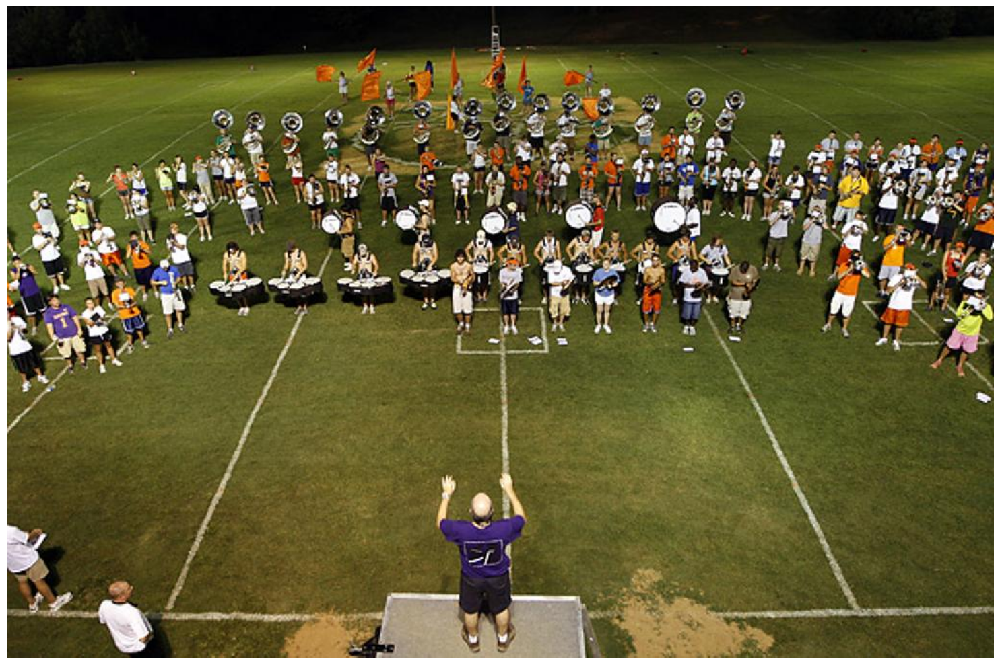


Image 2/5
Total faces detected: 7
Successful skin tone analyses: 6/7
Skin tone distribution: {'4': 4, '5': 1, '7': 1}


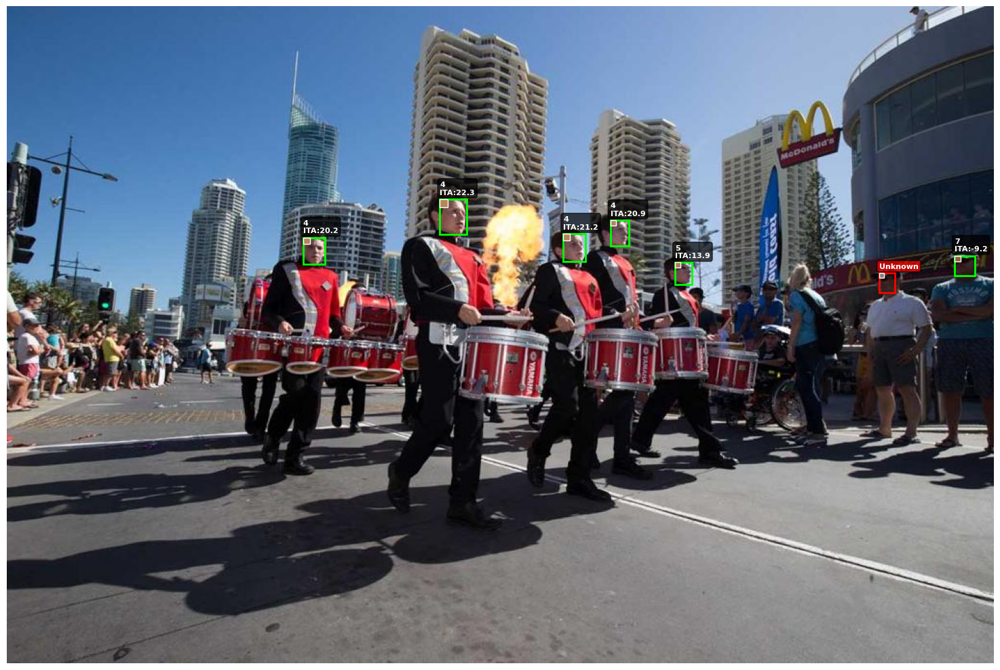


Image 3/5
Total faces detected: 99
Successful skin tone analyses: 14/99
Skin tone distribution: {'3': 12, '2': 2}


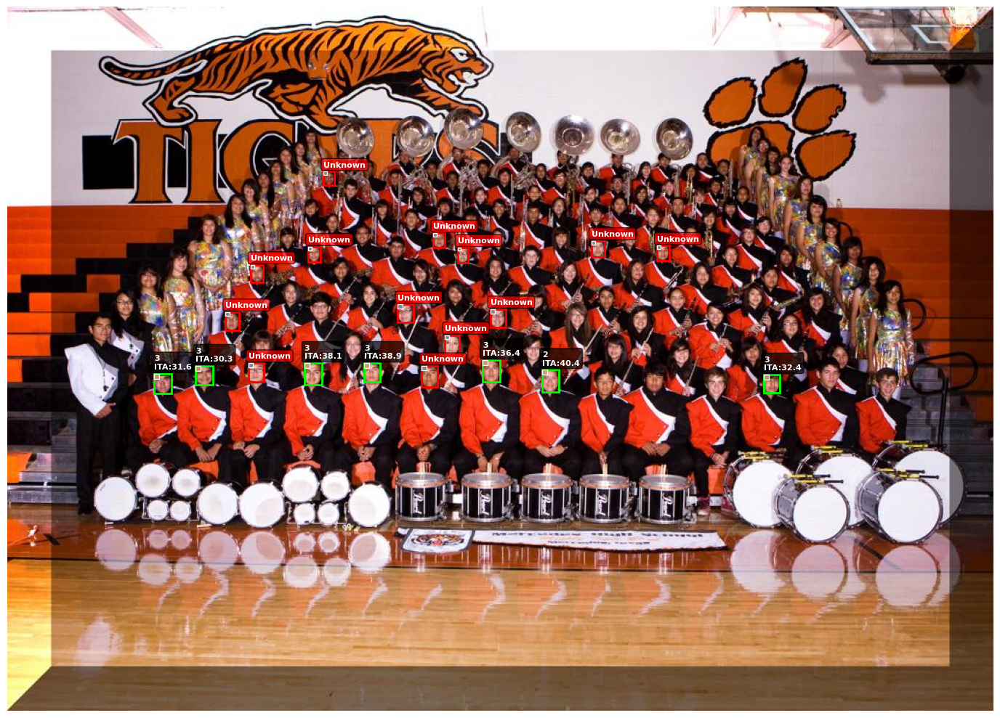


Image 4/5
Total faces detected: 5
Successful skin tone analyses: 5/5
Skin tone distribution: {'3': 5}


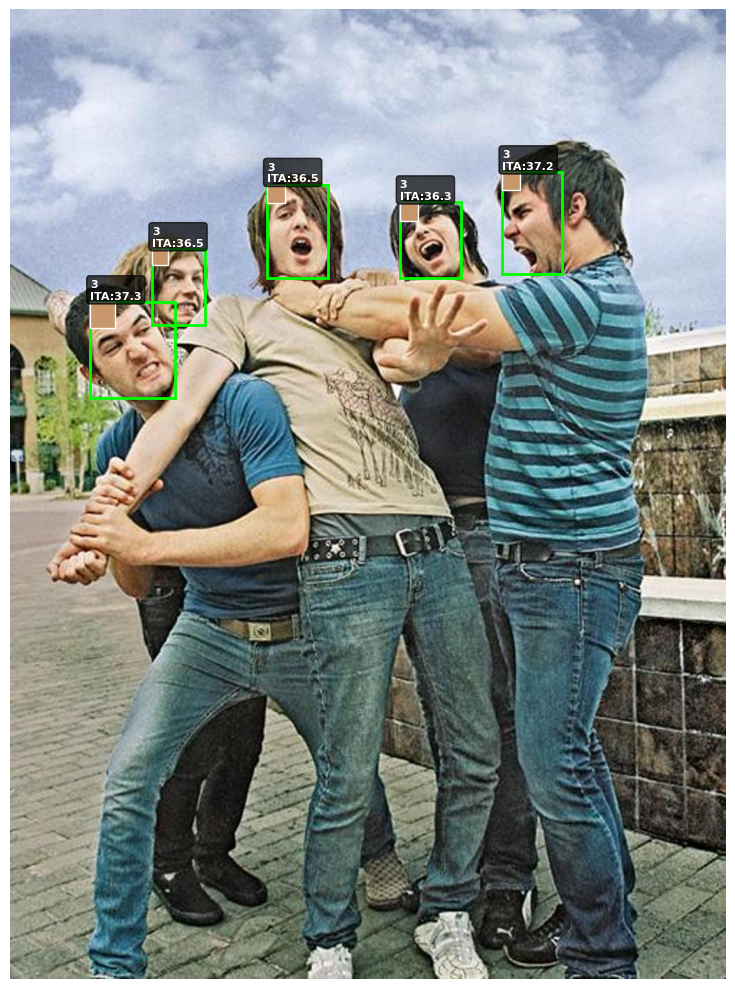


Image 5/5
Total faces detected: 4
Successful skin tone analyses: 3/4
Skin tone distribution: {'4': 2, '5': 1}


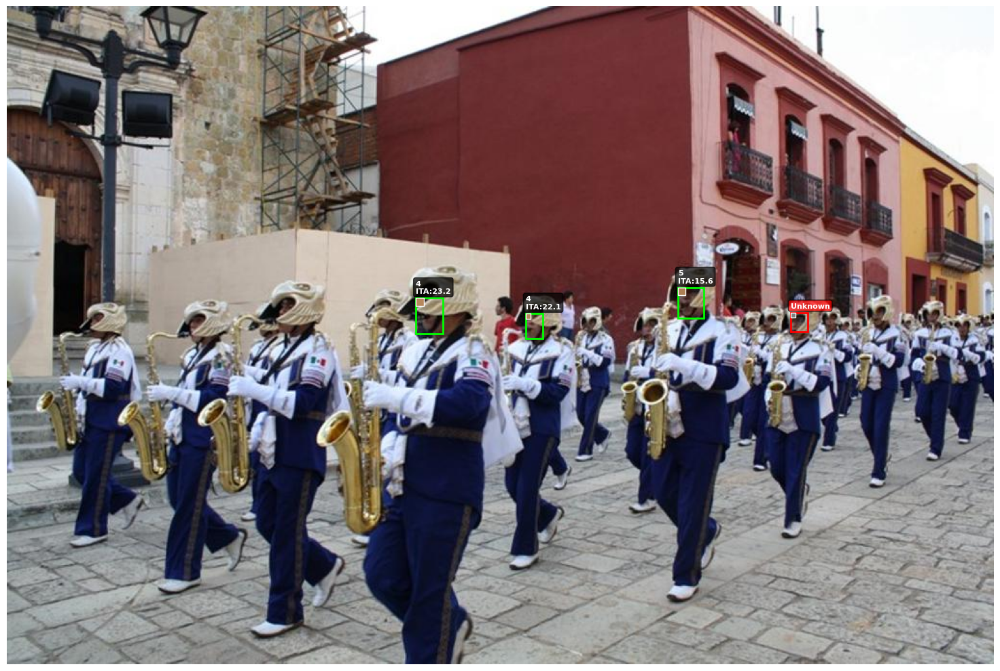

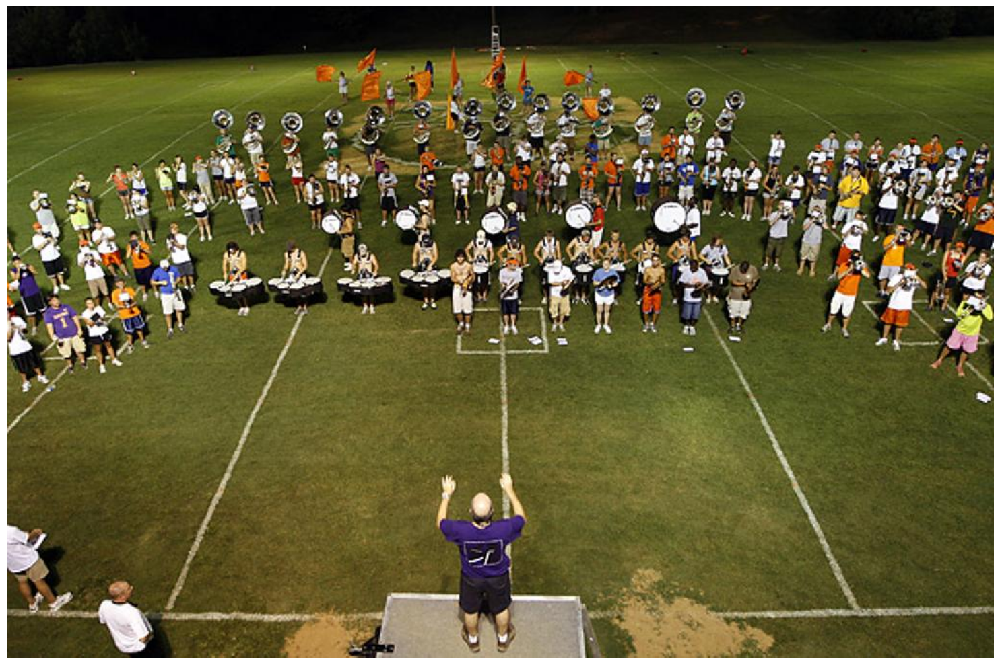


Overall Statistics
Total faces detected: 20177
Successful skin tone analyses: 15356 (76.1%)

Skin tone distribution (Fitzpatrick):
  Type 1: 46 (0.3%)
  Type 2: 1318 (8.6%)
  Type 3: 4237 (27.6%)
  Type 4: 4441 (28.9%)
  Type 5: 3107 (20.2%)
  Type 6: 1555 (10.1%)
  Type 7: 572 (3.7%)
  Type 8: 80 (0.5%)


In [7]:
from datasets import load_dataset
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import hsv_to_rgb

def ita_to_rgb(ita):
    """
    Convert ITA° value to an approximate RGB color for visualization.
    Uses a gradient from light (high ITA) to dark (low ITA).
    """
    if ita is None:
        return (128, 128, 128)  # Gray for unknown
    
    # Normalize ITA° to 0-1 range
    # ITA typically ranges from about -60 to +60
    normalized = (ita + 60) / 120.0
    normalized = max(0, min(1, normalized))
    
    # Create a brown-to-beige gradient using HSV
    # Hue: ~30 degrees (orange-brown range)
    # Saturation: moderate
    # Value: varies from dark to light based on ITA
    h = 0.08  # Brown-orange hue
    s = 0.4 + (0.3 * (1 - normalized))  # More saturation for darker tones
    v = 0.3 + (0.6 * normalized)  # Darker for low ITA, lighter for high ITA
    
    rgb = hsv_to_rgb([h, s, v])
    return tuple(int(c * 255) for c in rgb)

def visualize_faces_with_skin_tone(image, pred, max_faces=None, figsize=(15, 10)):
    """
    Visualize detected faces with bounding boxes and skin tone color indicators.
    
    Args:
        image: PIL Image or numpy array
        pred: Single prediction dict with 'boxes', 'scores', 'skin_tones'
        max_faces: Maximum number of faces to display (None for all)
        figsize: Figure size for matplotlib
    """
    import numpy as np
    from PIL import Image
    
    # Convert to numpy array if needed
    if isinstance(image, Image.Image):
        img_array = np.array(image)
    else:
        img_array = image.copy()
    
    fig, ax = plt.subplots(1, figsize=figsize)
    ax.imshow(img_array)
    
    boxes = pred['boxes']
    scores = pred['scores']
    skin_tones = pred['skin_tones']
    
    # Limit number of faces if specified
    num_faces = len(boxes) if max_faces is None else min(len(boxes), max_faces)
    
    for i in range(num_faces):
        box = boxes[i]
        score = scores[i]
        skin_tone = skin_tones[i]
        
        x, y, w, h = box
        
        # Draw bounding box
        rect = patches.Rectangle(
            (x, y), w, h,
            linewidth=2,
            edgecolor='lime' if skin_tone['ita'] is not None else 'red',
            facecolor='none'
        )
        ax.add_patch(rect)
        
        # Get skin tone color
        if skin_tone['ita'] is not None:
            rgb_color = ita_to_rgb(skin_tone['ita'])
            rgb_normalized = tuple(c / 255.0 for c in rgb_color)
            
            # Draw skin tone color box (small square in top-left of bbox)
            color_box_size = min(w, h) * 0.3
            color_rect = patches.Rectangle(
                (x, y),
                color_box_size,
                color_box_size,
                linewidth=1,
                edgecolor='white',
                facecolor=rgb_normalized
            )
            ax.add_patch(color_rect)
            
            # Add label with skin tone category and ITA
            label = f"{skin_tone['skin_tone_category']}\nITA:{skin_tone['ita']:.1f}"
            ax.text(
                x, y - 5,
                label,
                color='white',
                fontsize=8,
                fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.7)
            )
        else:
            # Unknown skin tone - gray box
            color_box_size = min(w, h) * 0.3
            color_rect = patches.Rectangle(
                (x, y),
                color_box_size,
                color_box_size,
                linewidth=1,
                edgecolor='white',
                facecolor=(0.5, 0.5, 0.5)
            )
            ax.add_patch(color_rect)
            
            ax.text(
                x, y - 5,
                "Unknown",
                color='white',
                fontsize=8,
                fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='red', alpha=0.7)
            )
    
    ax.axis('off')
    plt.tight_layout()
    return fig

def visualize_dataset_with_skin_tone(dataset, preds, num_images=5, max_faces_per_image=20):
    """
    Visualize multiple images from the dataset with skin tone annotations.
    
    Args:
        dataset: Hugging Face dataset
        preds: List of prediction dicts
        num_images: Number of images to display
        max_faces_per_image: Maximum faces to show per image
    """
    num_images = min(num_images, len(dataset))
    
    for idx in range(num_images):
        image = dataset[idx]['image']
        pred = preds[idx]
        
        print(f"\n{'='*60}")
        print(f"Image {idx + 1}/{num_images}")
        print(f"Total faces detected: {len(pred['boxes'])}")
        
        # Count successful analyses
        successful = sum(1 for st in pred['skin_tones'] if st['ita'] is not None)
        print(f"Successful skin tone analyses: {successful}/{len(pred['boxes'])}")
        
        # Show distribution
        if successful > 0:
            from collections import Counter
            categories = [
                st['skin_tone_category'] 
                for st in pred['skin_tones'] 
                if st['ita'] is not None
            ]
            dist = Counter(categories)
            print(f"Skin tone distribution: {dict(dist)}")
        
        fig = visualize_faces_with_skin_tone(
            image, 
            pred, 
            max_faces=max_faces_per_image,
            figsize=(15, 10)
        )
        plt.show()

# Load your dataset
dataset = load_dataset("CUHK-CSE/wider_face", split="validation", trust_remote_code=True)

# Use Fitzpatrick scale
# preds_fitz, gts, times = evaluate_scrfd_with_skin_tone(
#     dataset,
#     confidence_threshold=0.5,
#     skin_tone_scale=SkinToneScale.FITZPATRICK
# )

preds_fitz, gts, times = evaluate_scrfd_with_skin_tone(
    dataset,
    confidence_threshold=0.5,
    skin_tone_scale=SkinToneScale.MONK
)

# Visualize results
visualize_dataset_with_skin_tone(dataset, preds_fitz, num_images=5, max_faces_per_image=20)

# Or visualize a single image
idx = 0
fig = visualize_faces_with_skin_tone(
    dataset[idx]['image'],
    preds_fitz[idx],
    figsize=(15, 10)
)
plt.show()

# Calculate overall statistics
total_faces = sum(len(pred['boxes']) for pred in preds_fitz)
successful_analyses = sum(
    1 for pred in preds_fitz 
    for st in pred['skin_tones'] 
    if st['ita'] is not None
)
print(f"\n{'='*60}")
print(f"Overall Statistics")
print(f"{'='*60}")
print(f"Total faces detected: {total_faces}")
print(f"Successful skin tone analyses: {successful_analyses} ({100*successful_analyses/total_faces:.1f}%)")

# Distribution by skin tone category
from collections import Counter
categories = [
    st['skin_tone_category'] 
    for pred in preds_fitz 
    for st in pred['skin_tones']
    if st['ita'] is not None
]
distribution = Counter(categories)
print(f"\nSkin tone distribution (Fitzpatrick):")
for category in sorted(distribution.keys()):
    count = distribution[category]
    print(f"  Type {category}: {count} ({100*count/successful_analyses:.1f}%)")

In [9]:
import os
import pandas as pd
from PIL import Image

# Path to your dataset
DATA_DIR = "MonkSkinToneDataset/mst-e_data"
CSV_PATH = os.path.join(DATA_DIR, "mst-e_image_details.csv")

# Load metadata
df = pd.read_csv(CSV_PATH)

# Keep only image rows (ignore .mp4)
df = df[~df["image_ID"].str.endswith(".mp4")].reset_index(drop=True)

# Add full paths to each image
def resolve_image_path(row):
    subject_folder = os.path.join(DATA_DIR, row["subject_name"])
    image_path = os.path.join(subject_folder, row["image_ID"])
    return image_path

df["image_path"] = df.apply(resolve_image_path, axis=1)

# Filter for existing files only (sometimes CSV might reference missing images)
df = df[df["image_path"].apply(os.path.exists)].reset_index(drop=True)

print(f"✅ Loaded {len(df)} valid image entries")
df.head()

✅ Loaded 1511 valid image entries


,image_ID,pose,lighting,mask,subject_name,MST,image_path
0,PXL_20220922_183640936.PORTRAIT.jpg,frontal,poorly_lit,0,subject_18,1,MonkSkinToneDataset/mst-e_data\subject_18\PXL_...
1,PXL_20220922_183639710.PORTRAIT.jpg,bottom,poorly_lit,0,subject_18,1,MonkSkinToneDataset/mst-e_data\subject_18\PXL_...
2,PXL_20220922_183638393.PORTRAIT.jpg,side,poorly_lit,0,subject_18,1,MonkSkinToneDataset/mst-e_data\subject_18\PXL_...
3,PXL_20220922_183636542.PORTRAIT.jpg,side,poorly_lit,0,subject_18,1,MonkSkinToneDataset/mst-e_data\subject_18\PXL_...
4,PXL_20220922_183634690.PORTRAIT.jpg,side,poorly_lit,0,subject_18,1,MonkSkinToneDataset/mst-e_data\subject_18\PXL_...


In [ ]:
from datasets import Dataset

# Load images as PIL objects and attach MST labels
def load_image_and_label(example):
    example["image"] = Image.open(example["image_path"]).convert("RGB")
    example["faces"] = {"bbox": []}  # placeholder
    example["monk_tone"] = int(example["MST"])
    return example

dataset_dicts = df.to_dict(orient="records")
dataset = Dataset.from_list(dataset_dicts).map(load_image_and_label)

print(dataset)

Map:  66%|██████▌   | 991/1511 [06:47<14:36,  1.69s/ examples]  

In [2]:
import os
import pandas as pd
from datasets import Dataset, Features, Value, Image as HFImage

# Path to dataset
DATA_DIR = "MonkSkinToneDataset/mst-e_data"
CSV_PATH = os.path.join(DATA_DIR, "mst-e_image_details.csv")

# Load CSV
df = pd.read_csv(CSV_PATH)

# We use .astype(int) which will work for both string digits ('0') and floats (0.0)
df["mask"] = pd.to_numeric(df["mask"], errors='coerce').fillna(-1).astype(int) 

# --- Filter valid image entries ---
df = df[
    (~df["image_ID"].str.endswith(".mp4")) &
    (~df["image_ID"].str.endswith(".dng")) &
    # This comparison now correctly compares an integer to an integer
    (df["mask"] == 0)
].reset_index(drop=True)

# Add full image paths
df["image_path"] = df.apply(
    lambda r: os.path.join(DATA_DIR, str(r["subject_name"]), str(r["image_ID"])),
    axis=1
)
df = df[df["image_path"].apply(os.path.exists)].reset_index(drop=True)

print(f"✅ {len(df)} valid images found")

# Define dataset features (lazy image loading)
features = Features({
    "image": HFImage(),         # <--- this is lazy, not preloaded
    "image_path": Value("string"),
    "monk_tone": Value("int32")
})

# Create dataset
records = df[["image_path", "MST"]].rename(columns={"MST": "monk_tone"})
dataset = Dataset.from_pandas(records, features=features)

print(dataset)
print(dataset.features)

✅ 1335 valid images found
Dataset({
    features: ['image', 'image_path', 'monk_tone'],
    num_rows: 1335
})
{'image': Image(mode=None, decode=True, id=None), 'image_path': Value(dtype='string', id=None), 'monk_tone': Value(dtype='int32', id=None)}


In [ ]:
from insightface.app import FaceAnalysis
from tqdm import tqdm
import numpy as np
import cv2
import time
from typing import List, Dict, Tuple, Optional
from enum import Enum
import pandas as pd
import os
from PIL import Image

class SkinToneScale(Enum):
    """Skin tone classification scales"""
    FITZPATRICK = "fitzpatrick"
    MONK = "monk"

class SkinToneAnalyzer:
    """
    Analyzes skin tone from face images using ITA° (Individual Typology Angle)
    based on "Beyond Fitzpatrick: automated artificial intelligence-based skin tone analysis"
    """
    
    # Fitzpatrick Scale ITA° thresholds (6 categories)
    FITZPATRICK_THRESHOLDS = {
        'I': (55, float('inf')),       # Very fair
        'II': (41, 55),                # Fair
        'III': (28, 41),               # Medium
        'IV': (10, 28),                # Olive
        'V': (-30, 10),                # Brown
        'VI': (float('-inf'), -30)     # Dark brown/black
    }
    
    # Monk Skin Tone Scale ITA° thresholds (10 categories) based on published ITA ranges
    # Note: Bounds are defined as (lower, upper) to work with the 'lower <= ita < upper' classification logic.
    MONK_THRESHOLDS = {
        # ITA range from 81.62 to 100.0
        '1': (81.62, 100.0), 
        
        # ITA range from 75.99 to 81.62
        '2': (75.99, 81.62),
        
        # ITA range from 68.24 to 75.99
        '3': (68.24, 75.99),
        
        # ITA range from 57.53 to 68.24
        '4': (57.53, 68.24),
        
        # ITA range from 30.61 to 57.53
        '5': (30.61, 57.53),
        
        # ITA range from -4.63 to 30.61
        '6': (-4.63, 30.61),
        
        # ITA range from -37.77 to -4.63
        '7': (-37.77, -4.63),
        
        # ITA range from -66.87 to -37.77
        '8': (-66.87, -37.77),
        
        # ITA range from -81.33 to -66.87
        '9': (-81.33, -66.87),
        
        # ITA range from -100.00 to -81.33
        '10': (-100.00, -81.33) 
    }
    
    def __init__(self, scale: SkinToneScale = SkinToneScale.FITZPATRICK):
        """
        Initialize skin tone analyzer.
        """
        self.scale = scale
        self.thresholds = (self.FITZPATRICK_THRESHOLDS if scale == SkinToneScale.FITZPATRICK 
                             else self.MONK_THRESHOLDS)
    
    def rgb_to_lab(self, rgb_image: np.ndarray) -> np.ndarray:
        """
        Convert RGB image to CIE L*a*b* color space.
        Uses BGR2LAB internally because OpenCV typically reads images as BGR
        and the input is converted from PIL/HF, which results in RGB, 
        so we need to use RGB2LAB here.
        """
        return cv2.cvtColor(rgb_image, cv2.COLOR_RGB2LAB)
    
    def segment_skin(self, face_crop: np.ndarray, landmarks: np.ndarray = None) -> np.ndarray:
        """
        Segment skin pixels from face crop, focusing on the center region (cheeks).
        (Implementation unchanged, focused on robust skin detection)
        """
        if face_crop.size == 0 or face_crop.shape[0] < 10 or face_crop.shape[1] < 10:
            return np.zeros(face_crop.shape[:2], dtype=np.uint8)
        
        h, w = face_crop.shape[:2]
        
        # Method 1: YCrCb color space
        ycrcb = cv2.cvtColor(face_crop, cv2.COLOR_RGB2YCrCb)
        lower_skin = np.array([0, 133, 77], dtype=np.uint8)
        upper_skin = np.array([255, 173, 127], dtype=np.uint8)
        mask1 = cv2.inRange(ycrcb, lower_skin, upper_skin)
        
        # Method 2: HSV color space (more robust for varying lighting)
        hsv = cv2.cvtColor(face_crop, cv2.COLOR_RGB2HSV)
        lower_hsv = np.array([0, 20, 70], dtype=np.uint8)
        upper_hsv = np.array([20, 150, 255], dtype=np.uint8)
        mask2 = cv2.inRange(hsv, lower_hsv, upper_hsv)
        
        # Combine both masks
        skin_mask = cv2.bitwise_or(mask1, mask2)
        
        # Apply morphological operations to clean up mask
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
        skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)
        
        # Exclude top/bottom (hair/neck) and focus on center region (cheeks)
        exclusion_mask = np.ones((h, w), dtype=np.uint8) * 255
        exclusion_mask[:int(h*0.15), :] = 0
        exclusion_mask[int(h*0.9):, :] = 0
        
        center_mask = np.zeros((h, w), dtype=np.uint8)
        center_h_start = int(h * 0.25)
        center_h_end = int(h * 0.75)
        center_w_start = int(w * 0.2)
        center_w_end = int(w * 0.8)
        center_mask[center_h_start:center_h_end, center_w_start:center_w_end] = 255
        
        # Combine masks
        skin_mask = cv2.bitwise_and(skin_mask, exclusion_mask)
        skin_mask = cv2.bitwise_and(skin_mask, center_mask)
        
        return skin_mask
    
    def calculate_ita(self, lab_image: np.ndarray, mask: np.ndarray = None) -> Optional[float]:
        """
        Calculate Individual Typology Angle (ITA°) from LAB image.
        
        ITA° = arctan((L* - 50) / b*) x 180/π
        
        Args:
            lab_image: Image in CIE L*a*b* color space (L* 0-255, a/b 0-255 in OpenCV range)
            mask: Optional binary mask to specify which pixels to use
            
        Returns:
            ITA° value in degrees, or None if insufficient valid pixels
        """
        if mask is not None:
            # Extract only masked pixels
            l_values = lab_image[:, :, 0][mask > 0]
            b_values = lab_image[:, :, 2][mask > 0]
        else:
            l_values = lab_image[:, :, 0].flatten()
            b_values = lab_image[:, :, 2].flatten()
        
        # Need at least 100 pixels for reliable measurement
        if len(l_values) < 100:
            return None
        
        # Calculate mean L* and b* (OpenCV ranges: L* 0-255, b* 0-255)
        mean_l_opencv = np.mean(l_values) 
        mean_b_opencv = np.mean(b_values)
        
        # 1. CRITICAL FIX 1: Scale L* from OpenCV's 0-255 range to the standard 0-100 range
        mean_l_scaled = mean_l_opencv * (100.0 / 255.0)
        
        # 2. CRITICAL FIX 2: Shift b* from OpenCV's 0-255 range to the standard -128 to 127 range (center is 128)
        mean_b_scaled = mean_b_opencv - 128.0
        
        # Handle edge case where mean_b is very close to 0 to prevent division by zero or huge ITA
        if abs(mean_b_scaled) < 0.01:
            mean_b_scaled = 0.01
        
        # Calculate ITA° using the SCALED L* and SCALED b* value
        ita = np.arctan2((mean_l_scaled - 50), mean_b_scaled) * (180 / np.pi)
        
        # Store scaled values for returning in the analysis result
        self._last_mean_L = mean_l_scaled 
        self._last_mean_b = mean_b_scaled
        
        return float(ita)
    
    def classify_skin_tone(self, ita: float) -> str:
        """
        Classify skin tone based on ITA° value.
        """
        if ita is None:
            return "Unknown"
                
        for category, (lower, upper) in self.thresholds.items():
                # Handle both ascending and descending ranges
                if lower <= upper:
                    # Ascending range (e.g., Fitzpatrick where lower < upper)
                    if lower <= ita < upper:
                        return category
                else:
                    # Descending range (e.g., Monk where lower > upper)
                    if upper <= ita < lower:
                        return category
        
        return "Unknown"
    
    def analyze_face(self, image: np.ndarray, bbox: List[int], 
                     landmarks: np.ndarray = None) -> Dict:
        """
        Analyze skin tone for a single detected face.
        """
        x1, y1, x2, y2 = [int(coord) for coord in bbox]
        
        # Validate bounding box
        h_img, w_img = image.shape[:2]
        x1 = max(0, min(x1, w_img))
        y1 = max(0, min(y1, h_img))
        x2 = max(0, min(x2, w_img))
        y2 = max(0, min(y2, h_img))
        
        face_crop = image[y1:y2, x1:x2]
        
        if face_crop.size == 0 or face_crop.shape[0] < 10 or face_crop.shape[1] < 10:
            return {
                'ita': None,
                'skin_tone_category': 'Unknown',
                'scale': self.scale.value,
                'error': 'Invalid face crop (too small or empty)',
                'mean_L': None,
                'mean_b': None
            }
        
        try:
            skin_mask = self.segment_skin(face_crop, landmarks)
            
            skin_pixel_count = np.sum(skin_mask > 0)
            if skin_pixel_count < 100:
                return {
                    'ita': None,
                    'skin_tone_category': 'Unknown',
                    'scale': self.scale.value,
                    'error': f'Insufficient skin pixels detected ({skin_pixel_count})',
                    'mean_L': None,
                    'mean_b': None
                }
            
            lab_image = self.rgb_to_lab(face_crop)
            
            # Calculate ITA° (this call sets self._last_mean_L and self._last_mean_b)
            ita = self.calculate_ita(lab_image, skin_mask)
            
            if ita is None:
                return {
                    'ita': None,
                    'skin_tone_category': 'Unknown',
                    'scale': self.scale.value,
                    'error': 'Failed to calculate ITA',
                    'mean_L': None,
                    'mean_b': None
                }
            
            category = self.classify_skin_tone(ita)
            
            return {
                'ita': ita,
                'skin_tone_category': category,
                'scale': self.scale.value,
                'mean_L': getattr(self, '_last_mean_L', None), # Retrieve scaled L*
                'mean_b': getattr(self, '_last_mean_b', None),
                'skin_pixels': int(skin_pixel_count)
            }
            
        except Exception as e:
            return {
                'ita': None,
                'skin_tone_category': 'Unknown',
                'scale': self.scale.value,
                'error': f'Exception during analysis: {str(e)}',
                'mean_L': None,
                'mean_b': None
            }


def evaluate_scrfd_with_skin_tone(dataset, 
                                  confidence_threshold: float = 0.5,
                                  batch_size: int = 32,
                                  ctx_id: int = 0,
                                  save_filenames: bool = False,
                                  skin_tone_scale: SkinToneScale = SkinToneScale.FITZPATRICK):
    """
    Evaluate SCRFD detector with skin tone analysis for each detected face.
    """
    # Initialize SCRFD detector
    app = FaceAnalysis(allowed_modules=['detection'])
    app.prepare(ctx_id=ctx_id, det_thresh=confidence_threshold)
    
    # Initialize skin tone analyzer
    skin_analyzer = SkinToneAnalyzer(scale=skin_tone_scale)
    
    # Convert dataset to list
    images = [np.array(sample['image'].convert('RGB')) for sample in dataset]
    gts = [sample['faces']['bbox'] for sample in dataset]
    image_names = [sample['image'].filename if save_filenames else None for sample in dataset]
    
    preds = []
    inference_times = []
    
    for i in tqdm(range(0, len(images), batch_size), desc="Evaluating SCRFD + Skin Tone", unit="batch"):
        batch_imgs = images[i:i+batch_size]
        batch_names = image_names[i:i+batch_size] if save_filenames else [None]*len(batch_imgs)
        
        start = time.time()
        batch_faces = [app.get(img) for img in batch_imgs]
        batch_time = time.time() - start
        
        per_image_time = batch_time / len(batch_imgs)
        
        for img, faces, img_name in zip(batch_imgs, batch_faces, batch_names):
            boxes, scores, skin_tones = [], [], []
            
            for face in faces:
                if face.det_score >= confidence_threshold:
                    x1, y1, x2, y2 = face.bbox.astype(int)
                    boxes.append([int(x1), int(y1), int(x2 - x1), int(y2 - y1)])
                    scores.append(face.det_score)
                    
                    # Analyze skin tone for this face
                    landmarks = face.kps if hasattr(face, 'kps') else None
                    skin_tone_result = skin_analyzer.analyze_face(
                        img, 
                        [x1, y1, x2, y2],
                        landmarks
                    )
                    skin_tones.append(skin_tone_result)
            
            pred_dict = {
                'boxes': boxes,
                'scores': scores,
                'skin_tones': skin_tones
            }
            
            if save_filenames:
                pred_dict['image_name'] = img_name
            
            preds.append(pred_dict)
            inference_times.append(per_image_time)
    
    return preds, gts, inference_times


def evaluate_scrfd_with_skin_tone_batching(dataset, 
                                           confidence_threshold: float = 0.5,
                                           batch_size: int = 32,
                                           ctx_id: int = 0,
                                           save_filenames: bool = False,
                                           skin_tone_scale: SkinToneScale = SkinToneScale.FITZPATRICK):
    """
    Evaluate SCRFD detector with skin tone analysis for each detected face.
    Images are loaded lazily from 'image_path' to save memory.
    """
    
    # Initialize SCRFD detector
    app = FaceAnalysis(allowed_modules=['detection'])
    app.prepare(ctx_id=ctx_id, det_thresh=confidence_threshold)
    
    # Initialize skin tone analyzer
    skin_analyzer = SkinToneAnalyzer(scale=skin_tone_scale)
    
    preds = []
    gts = []  # placeholder, as your dataset has no face boxes
    inference_times = []
    
    num_images = len(dataset)
    
    for i in tqdm(range(0, num_images, batch_size), desc="Evaluating SCRFD + Skin Tone", unit="batch"):
        # Convert batch slice to list of dicts
        batch = [dataset[j] for j in range(i, min(i+batch_size, len(dataset)))]
        
        # Lazy load images just for this batch
        batch_imgs = []
        batch_names = []
        for sample in batch:
            img_path = sample['image_path']
            try:
                img = Image.open(img_path).convert('RGB')
                batch_imgs.append(np.array(img))
            except Exception as e:
                # print(f"⚠️ Skipping image {img_path}: {e}") # Suppressing debug print for cleaner output
                batch_imgs.append(None)
            batch_names.append(os.path.basename(img_path) if save_filenames else None)

        
        # Filter out failed loads
        valid_indices = [idx for idx, img in enumerate(batch_imgs) if img is not None]
        valid_imgs = [batch_imgs[idx] for idx in valid_indices]
        valid_names = [batch_names[idx] for idx in valid_indices]
        
        start = time.time()
        batch_faces = [app.get(img) for img in valid_imgs]
        batch_time = time.time() - start
        per_image_time = batch_time / max(len(valid_imgs), 1)
        
        for img, faces, img_name in zip(valid_imgs, batch_faces, valid_names):
            boxes, scores, skin_tones = [], [], []
            
            for face in faces:
                if face.det_score >= confidence_threshold:
                    x1, y1, x2, y2 = face.bbox.astype(int)
                    boxes.append([int(x1), int(y1), int(x2 - x1), int(y2 - y1)])
                    scores.append(face.det_score)
                    
                    landmarks = face.kps if hasattr(face, 'kps') else None
                    skin_tone_result = skin_analyzer.analyze_face(
                        img, [x1, y1, x2, y2], landmarks
                    )
                    skin_tones.append(skin_tone_result)
            
            pred_dict = {
                'boxes': boxes,
                'scores': scores,
                'skin_tones': skin_tones
            }
            
            if save_filenames:
                pred_dict['image_name'] = img_name
            
            preds.append(pred_dict)
            gts.append([])  # placeholder for ground-truth boxes
            inference_times.append(per_image_time)
    
    return preds, gts, inference_times

In [35]:
from insightface.app import FaceAnalysis
from tqdm import tqdm
import numpy as np
import cv2
import time
from typing import List, Dict, Tuple, Optional
from enum import Enum
import pandas as pd
import os
from PIL import Image

class SkinToneScale(Enum):
    """Skin tone classification scales"""
    FITZPATRICK = "fitzpatrick"
    MONK = "monk"

class SkinToneAnalyzer:
    """
    Analyzes skin tone from face images using ITA° (Individual Typology Angle)
    with improvements for lighting robustness and specular highlight removal.
    """
    
    # Fitzpatrick Scale ITA° thresholds (6 categories)
    FITZPATRICK_THRESHOLDS = {
        'I': (55, float('inf')),
        'II': (41, 55),
        'III': (28, 41),
        'IV': (10, 28),
        'V': (-30, 10),
        'VI': (float('-inf'), -30)
    }
    
    # Monk Skin Tone Scale ITA° thresholds (10 categories)
    MONK_THRESHOLDS = {
        '1': (81.62, 100.0),
        '2': (75.99, 81.62),
        '3': (68.24, 75.99),
        '4': (57.53, 68.24),
        '5': (30.61, 57.53),
        '6': (-4.63, 30.61),
        '7': (-37.77, -4.63),
        '8': (-66.87, -37.77),
        '9': (-81.33, -66.87),
        '10': (-100.00, -81.33)
    }
    
    def __init__(self, scale: SkinToneScale = SkinToneScale.FITZPATRICK, 
                 apply_white_balance: bool = True):
        """
        Initialize skin tone analyzer.
        
        Args:
            scale: Classification scale to use (Fitzpatrick or Monk)
            apply_white_balance: Whether to apply automatic white balance correction
        """
        self.scale = scale
        self.thresholds = (self.FITZPATRICK_THRESHOLDS if scale == SkinToneScale.FITZPATRICK 
                          else self.MONK_THRESHOLDS)
        self.apply_white_balance = apply_white_balance
    
    def auto_white_balance(self, image: np.ndarray) -> np.ndarray:
        """
        Apply automatic white balance using Gray World assumption.
        This helps correct color casts from different lighting conditions.
        
        Args:
            image: RGB image
            
        Returns:
            White-balanced RGB image
        """
        # Calculate mean for each channel
        avg_r = np.mean(image[:, :, 0])
        avg_g = np.mean(image[:, :, 1])
        avg_b = np.mean(image[:, :, 2])
        
        # Calculate average gray value
        avg_gray = (avg_r + avg_g + avg_b) / 3
        
        # Avoid division by zero
        if avg_r == 0 or avg_g == 0 or avg_b == 0:
            return image
        
        # Calculate scaling factors
        scale_r = avg_gray / avg_r
        scale_g = avg_gray / avg_g
        scale_b = avg_gray / avg_b
        
        # Apply scaling
        balanced = image.copy().astype(np.float32)
        balanced[:, :, 0] = np.clip(balanced[:, :, 0] * scale_r, 0, 255)
        balanced[:, :, 1] = np.clip(balanced[:, :, 1] * scale_g, 0, 255)
        balanced[:, :, 2] = np.clip(balanced[:, :, 2] * scale_b, 0, 255)
        
        return balanced.astype(np.uint8)
    
    def remove_specular_highlights(self, image: np.ndarray, mask: np.ndarray) -> np.ndarray:
        """
        Remove specular highlights (shiny spots) from the skin mask.
        Highlights have high intensity and low saturation.
        
        Args:
            image: RGB image
            mask: Initial skin mask
            
        Returns:
            Updated mask with specular highlights removed
        """
        # Convert to HSV
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        
        # Create mask for specular highlights
        # High value (brightness) and low saturation indicate specular reflection
        v_channel = hsv[:, :, 2]
        s_channel = hsv[:, :, 1]
        
        # Threshold for highlights: V > 200 and S < 50
        highlight_mask = ((v_channel > 200) & (s_channel < 50)).astype(np.uint8) * 255
        
        # Remove highlights from skin mask
        mask_no_highlights = cv2.bitwise_and(mask, cv2.bitwise_not(highlight_mask))
        
        return mask_no_highlights
    
    def rgb_to_lab(self, rgb_image: np.ndarray) -> np.ndarray:
        """
        Convert RGB image to CIE L*a*b* color space.
        """
        return cv2.cvtColor(rgb_image, cv2.COLOR_RGB2LAB)
    
    def segment_skin(self, face_crop: np.ndarray, landmarks: np.ndarray = None) -> np.ndarray:
        """
        Segment skin pixels from face crop with improved robustness.
        Focuses on cheeks and forehead, avoiding specular highlights.
        """
        if face_crop.size == 0 or face_crop.shape[0] < 10 or face_crop.shape[1] < 10:
            return np.zeros(face_crop.shape[:2], dtype=np.uint8)
        
        h, w = face_crop.shape[:2]
        
        # Method 1: YCrCb color space
        ycrcb = cv2.cvtColor(face_crop, cv2.COLOR_RGB2YCrCb)
        lower_skin = np.array([0, 133, 77], dtype=np.uint8)
        upper_skin = np.array([255, 173, 127], dtype=np.uint8)
        mask1 = cv2.inRange(ycrcb, lower_skin, upper_skin)
        
        # Method 2: HSV color space (more robust for varying lighting)
        hsv = cv2.cvtColor(face_crop, cv2.COLOR_RGB2HSV)
        lower_hsv = np.array([0, 20, 70], dtype=np.uint8)
        upper_hsv = np.array([20, 150, 255], dtype=np.uint8)
        mask2 = cv2.inRange(hsv, lower_hsv, upper_hsv)
        
        # Combine both masks
        skin_mask = cv2.bitwise_or(mask1, mask2)
        
        # Apply morphological operations to clean up mask
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
        skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)
        
        # Remove specular highlights
        skin_mask = self.remove_specular_highlights(face_crop, skin_mask)
        
        # Exclude top/bottom (hair/neck) and focus on center region (cheeks + forehead)
        exclusion_mask = np.ones((h, w), dtype=np.uint8) * 255
        exclusion_mask[:int(h*0.1), :] = 0  # Less aggressive top exclusion
        exclusion_mask[int(h*0.85):, :] = 0  # Exclude lower face/neck
        
        # Focus on cheeks and forehead region
        center_mask = np.zeros((h, w), dtype=np.uint8)
        center_h_start = int(h * 0.2)
        center_h_end = int(h * 0.7)
        center_w_start = int(w * 0.2)
        center_w_end = int(w * 0.8)
        center_mask[center_h_start:center_h_end, center_w_start:center_w_end] = 255
        
        # Combine masks
        skin_mask = cv2.bitwise_and(skin_mask, exclusion_mask)
        skin_mask = cv2.bitwise_and(skin_mask, center_mask)
        
        return skin_mask
    
    def calculate_ita(self, lab_image: np.ndarray, mask: np.ndarray = None) -> Optional[float]:
        """
        Calculate Individual Typology Angle (ITA°) from LAB image.
        Uses median instead of mean for more robust estimation.
        
        ITA° = arctan((L* - 50) / b*) × 180/π
        
        Args:
            lab_image: Image in CIE L*a*b* color space (L* 0-255, a/b 0-255 in OpenCV range)
            mask: Optional binary mask to specify which pixels to use
            
        Returns:
            ITA° value in degrees, or None if insufficient valid pixels
        """
        if mask is not None:
            l_values = lab_image[:, :, 0][mask > 0]
            b_values = lab_image[:, :, 2][mask > 0]
        else:
            l_values = lab_image[:, :, 0].flatten()
            b_values = lab_image[:, :, 2].flatten()
        
        # Need at least 100 pixels for reliable measurement
        if len(l_values) < 100:
            return None
        
        # Remove outliers using percentile filtering (more robust than mean)
        l_percentile_low = np.percentile(l_values, 10)
        l_percentile_high = np.percentile(l_values, 90)
        b_percentile_low = np.percentile(b_values, 10)
        b_percentile_high = np.percentile(b_values, 90)
        
        # Filter outliers
        valid_mask = (
            (l_values >= l_percentile_low) & (l_values <= l_percentile_high) &
            (b_values >= b_percentile_low) & (b_values <= b_percentile_high)
        )
        
        l_values_filtered = l_values[valid_mask]
        b_values_filtered = b_values[valid_mask]
        
        if len(l_values_filtered) < 50:
            # Fall back to unfiltered if too few pixels remain
            l_values_filtered = l_values
            b_values_filtered = b_values
        
        # Use median for robustness (less sensitive to outliers than mean)
        mean_l_opencv = np.median(l_values_filtered)
        mean_b_opencv = np.median(b_values_filtered)
        
        # Scale L* from OpenCV's 0-255 range to the standard 0-100 range
        mean_l_scaled = mean_l_opencv * (100.0 / 255.0)
        
        # Shift b* from OpenCV's 0-255 range to the standard -128 to 127 range
        mean_b_scaled = mean_b_opencv - 128.0
        
        # Handle edge case where mean_b is very close to 0
        if abs(mean_b_scaled) < 0.01:
            mean_b_scaled = 0.01
        
        # Calculate ITA° using the SCALED L* and SCALED b* value
        ita = np.arctan2((mean_l_scaled - 50), mean_b_scaled) * (180 / np.pi)
        
        # Store scaled values for returning in the analysis result
        self._last_mean_L = mean_l_scaled 
        self._last_mean_b = mean_b_scaled
        
        return float(ita)
    
    def classify_skin_tone(self, ita: float) -> str:
        """
        Classify skin tone based on ITA° value.
        """
        if ita is None:
            return "Unknown"
        
        # For Monk scale, check ranges in order from lightest to darkest
        if self.scale == SkinToneScale.MONK:
            for category in ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']:
                lower, upper = self.thresholds[category]
                if lower <= ita <= upper:
                    return category
        else:
            # For Fitzpatrick, use the existing logic
            for category, (lower, upper) in self.thresholds.items():
                if lower <= upper:
                    if lower <= ita <= upper:
                        return category
                else:
                    if upper <= ita <= lower:
                        return category
        
        return "Unknown"
    
    def analyze_face(self, image: np.ndarray, bbox: List[int], 
                     landmarks: np.ndarray = None) -> Dict:
        """
        Analyze skin tone for a single detected face.
        """
        x1, y1, x2, y2 = [int(coord) for coord in bbox]
        
        # Validate bounding box
        h_img, w_img = image.shape[:2]
        x1 = max(0, min(x1, w_img))
        y1 = max(0, min(y1, h_img))
        x2 = max(0, min(x2, w_img))
        y2 = max(0, min(y2, h_img))
        
        face_crop = image[y1:y2, x1:x2]
        
        if face_crop.size == 0 or face_crop.shape[0] < 10 or face_crop.shape[1] < 10:
            return {
                'ita': None,
                'skin_tone_category': 'Unknown',
                'scale': self.scale.value,
                'error': 'Invalid face crop (too small or empty)',
                'mean_L': None,
                'mean_b': None
            }
        
        try:
            # Apply white balance correction if enabled
            if self.apply_white_balance:
                face_crop = self.auto_white_balance(face_crop)
            
            skin_mask = self.segment_skin(face_crop, landmarks)
            
            skin_pixel_count = np.sum(skin_mask > 0)
            if skin_pixel_count < 100:
                return {
                    'ita': None,
                    'skin_tone_category': 'Unknown',
                    'scale': self.scale.value,
                    'error': f'Insufficient skin pixels detected ({skin_pixel_count})',
                    'mean_L': None,
                    'mean_b': None
                }
            
            lab_image = self.rgb_to_lab(face_crop)
            
            # Calculate ITA°
            ita = self.calculate_ita(lab_image, skin_mask)
            
            if ita is None:
                return {
                    'ita': None,
                    'skin_tone_category': 'Unknown',
                    'scale': self.scale.value,
                    'error': 'Failed to calculate ITA',
                    'mean_L': None,
                    'mean_b': None
                }
            
            category = self.classify_skin_tone(ita)
            
            return {
                'ita': ita,
                'skin_tone_category': category,
                'scale': self.scale.value,
                'mean_L': getattr(self, '_last_mean_L', None),
                'mean_b': getattr(self, '_last_mean_b', None),
                'skin_pixels': int(skin_pixel_count)
            }
            
        except Exception as e:
            return {
                'ita': None,
                'skin_tone_category': 'Unknown',
                'scale': self.scale.value,
                'error': f'Exception during analysis: {str(e)}',
                'mean_L': None,
                'mean_b': None
            }


def evaluate_scrfd_with_skin_tone(dataset, 
                                  confidence_threshold: float = 0.5,
                                  batch_size: int = 32,
                                  ctx_id: int = 0,
                                  save_filenames: bool = False,
                                  skin_tone_scale: SkinToneScale = SkinToneScale.FITZPATRICK,
                                  apply_white_balance: bool = True):
    """
    Evaluate SCRFD detector with skin tone analysis for each detected face.
    
    Args:
        dataset: Dataset containing images
        confidence_threshold: Minimum confidence for face detection
        batch_size: Number of images to process in each batch
        ctx_id: Context ID for SCRFD (GPU ID)
        save_filenames: Whether to save image filenames in results
        skin_tone_scale: Scale to use (FITZPATRICK or MONK)
        apply_white_balance: Whether to apply automatic white balance correction
    """
    # Initialize SCRFD detector
    app = FaceAnalysis(allowed_modules=['detection'])
    app.prepare(ctx_id=ctx_id, det_thresh=confidence_threshold)
    
    # Initialize skin tone analyzer
    skin_analyzer = SkinToneAnalyzer(scale=skin_tone_scale, 
                                     apply_white_balance=apply_white_balance)
    
    # Convert dataset to list
    images = [np.array(sample['image'].convert('RGB')) for sample in dataset]
    gts = [sample['faces']['bbox'] for sample in dataset]
    image_names = [sample['image'].filename if save_filenames else None for sample in dataset]
    
    preds = []
    inference_times = []
    
    for i in tqdm(range(0, len(images), batch_size), desc="Evaluating SCRFD + Skin Tone", unit="batch"):
        batch_imgs = images[i:i+batch_size]
        batch_names = image_names[i:i+batch_size] if save_filenames else [None]*len(batch_imgs)
        
        start = time.time()
        batch_faces = [app.get(img) for img in batch_imgs]
        batch_time = time.time() - start
        
        per_image_time = batch_time / len(batch_imgs)
        
        for img, faces, img_name in zip(batch_imgs, batch_faces, batch_names):
            boxes, scores, skin_tones = [], [], []
            
            for face in faces:
                if face.det_score >= confidence_threshold:
                    x1, y1, x2, y2 = face.bbox.astype(int)
                    boxes.append([int(x1), int(y1), int(x2 - x1), int(y2 - y1)])
                    scores.append(face.det_score)
                    
                    # Analyze skin tone for this face
                    landmarks = face.kps if hasattr(face, 'kps') else None
                    skin_tone_result = skin_analyzer.analyze_face(
                        img, 
                        [x1, y1, x2, y2],
                        landmarks
                    )
                    skin_tones.append(skin_tone_result)
            
            pred_dict = {
                'boxes': boxes,
                'scores': scores,
                'skin_tones': skin_tones
            }
            
            if save_filenames:
                pred_dict['image_name'] = img_name
            
            preds.append(pred_dict)
            inference_times.append(per_image_time)
    
    return preds, gts, inference_times


def evaluate_scrfd_with_skin_tone_batching(dataset, 
                                           confidence_threshold: float = 0.5,
                                           batch_size: int = 32,
                                           ctx_id: int = 0,
                                           save_filenames: bool = False,
                                           skin_tone_scale: SkinToneScale = SkinToneScale.FITZPATRICK,
                                           apply_white_balance: bool = True):
    """
    Evaluate SCRFD detector with skin tone analysis for each detected face.
    Images are loaded lazily from 'image_path' to save memory.
    
    Args:
        dataset: Dataset containing image paths
        confidence_threshold: Minimum confidence for face detection
        batch_size: Number of images to process in each batch
        ctx_id: Context ID for SCRFD (GPU ID)
        save_filenames: Whether to save image filenames in results
        skin_tone_scale: Scale to use (FITZPATRICK or MONK)
        apply_white_balance: Whether to apply automatic white balance correction
    """
    
    # Initialize SCRFD detector
    app = FaceAnalysis(allowed_modules=['detection'])
    app.prepare(ctx_id=ctx_id, det_thresh=confidence_threshold)
    
    # Initialize skin tone analyzer
    skin_analyzer = SkinToneAnalyzer(scale=skin_tone_scale,
                                     apply_white_balance=apply_white_balance)
    
    preds = []
    gts = []
    inference_times = []
    
    num_images = len(dataset)
    
    for i in tqdm(range(0, num_images, batch_size), desc="Evaluating SCRFD + Skin Tone", unit="batch"):
        # Convert batch slice to list of dicts
        batch = [dataset[j] for j in range(i, min(i+batch_size, len(dataset)))]
        
        # Lazy load images just for this batch
        batch_imgs = []
        batch_names = []
        for sample in batch:
            img_path = sample['image_path']
            try:
                img = Image.open(img_path).convert('RGB')
                batch_imgs.append(np.array(img))
            except Exception as e:
                batch_imgs.append(None)
            batch_names.append(os.path.basename(img_path) if save_filenames else None)
        
        # Filter out failed loads
        valid_indices = [idx for idx, img in enumerate(batch_imgs) if img is not None]
        valid_imgs = [batch_imgs[idx] for idx in valid_indices]
        valid_names = [batch_names[idx] for idx in valid_indices]
        
        start = time.time()
        batch_faces = [app.get(img) for img in valid_imgs]
        batch_time = time.time() - start
        per_image_time = batch_time / max(len(valid_imgs), 1)
        
        for img, faces, img_name in zip(valid_imgs, batch_faces, valid_names):
            boxes, scores, skin_tones = [], [], []
            
            for face in faces:
                if face.det_score >= confidence_threshold:
                    x1, y1, x2, y2 = face.bbox.astype(int)
                    boxes.append([int(x1), int(y1), int(x2 - x1), int(y2 - y1)])
                    scores.append(face.det_score)
                    
                    landmarks = face.kps if hasattr(face, 'kps') else None
                    skin_tone_result = skin_analyzer.analyze_face(
                        img, [x1, y1, x2, y2], landmarks
                    )
                    skin_tones.append(skin_tone_result)
            
            pred_dict = {
                'boxes': boxes,
                'scores': scores,
                'skin_tones': skin_tones
            }
            
            if save_filenames:
                pred_dict['image_name'] = img_name
            
            preds.append(pred_dict)
            gts.append([])
            inference_times.append(per_image_time)
    
    return preds, gts, inference_times

In [36]:
preds_monk, gts, times = evaluate_scrfd_with_skin_tone_batching(
    dataset,
    confidence_threshold=0.5,
    batch_size=32,
    save_filenames=True,
    skin_tone_scale=SkinToneScale.MONK,
    apply_white_balance=True
)

Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CUDAExecutionProvider': {'device_id': '0', 'has_user_compute_stream': '0', 'cudnn_conv1d_pad_to_nc1d': '0', 'user_compute_stream': '0', 'gpu_external_alloc': '0', 'gpu_mem_limit': '18446744073709551615', 'enable_cuda_graph': '0', 'gpu_external_free': '0', 'gpu_external_empty_cache': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'do_copy_in_default_stream': '1', 'cudnn_conv_use_max_workspace': '1', 'tunable_op_enable': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'prefer_nhwc': '0', 'use_ep_level_unified_stream': '0', 'use_tf32': '1', 'sdpa_kernel': '0', 'fuse_conv_bias': '0'}, 'CPUExecutionProvider': {}}
model ignore: C:\Users\User/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CUDAExecut

Evaluating SCRFD + Skin Tone: 100%|██████████| 42/42 [03:52<00:00,  5.54s/batch]


In [37]:
# Black - 10
for item in preds_monk:
    if item['image_name'] == 'PXL_20220922_175601727.jpg':
        print(item)

# White - 1
for item in preds_monk:
    if item['image_name'] == 'PXL_20220922_182633863.jpg':
        print(item)

{'boxes': [[960, 1171, 1327, 1891]], 'scores': [np.float32(0.8432684)], 'skin_tones': [{'ita': -73.81495133526771, 'skin_tone_category': '9', 'scale': 'monk', 'mean_L': np.float64(25.88235294117647), 'mean_b': np.float64(7.0), 'skin_pixels': 492986}], 'image_name': 'PXL_20220922_175601727.jpg'}
{'boxes': [[1141, 1781, 987, 1443]], 'scores': [np.float32(0.82946545)], 'skin_tones': [{'ita': 27.235146699302522, 'skin_tone_category': '6', 'scale': 'monk', 'mean_L': np.float64(54.11764705882353), 'mean_b': np.float64(8.0), 'skin_pixels': 218332}], 'image_name': 'PXL_20220922_182633863.jpg'}


In [ ]:
# https://github.com/ChenglongMa/SkinToneClassifier/issues

### Further Testing - 20/11/2025

In [3]:
# pip install colormath

In [3]:
# Common Code

import cv2
import numpy as np
from skimage import color

# MONK SKIN TONE REFERENCE COLORS (Google-published RGBs) - Source: Monk et al. / Google MST palette (skintone.google)
MST_RGB = {
    1: (255, 227, 209),
    2: (255, 213, 188),
    3: (251, 194, 164),
    4: (236, 173, 137),
    5: (217, 151, 111),
    6: (181, 122, 88),
    7: (146, 94, 67),
    8: (117, 74, 52),
    9: (88, 55, 40),
    10: (70, 43, 29)
}

# Convert MST references to Lab
mst_lab_list = []
mst_tones = []
for tone, (r, g, b) in MST_RGB.items():
    rgb = np.array([[[r/255, g/255, b/255]]], dtype=np.float32)
    lab = color.rgb2lab(rgb)[0,0,:]
    mst_lab_list.append(lab)
    mst_tones.append(tone)

MST_LAB = np.vstack(mst_lab_list)
MST_TONES = np.array(mst_tones)

# Assign nearest MST tone via CIEDE2000
def mst_classify_from_lab(lab_skin: np.ndarray):
    """
    Compute CIEDE2000 distances between the skin Lab vector and each
    Monk Skin Tone reference, and choose the closest tone.

    Uses skimage.color.deltaE_ciede2000, which implements the official
    CIEDE2000 formula (Sharma et al., 2005).
    """
    lab_skin = np.asarray(lab_skin, dtype=np.float64).reshape(1, 1, 3)  # shape (1,1,3)
    mst = MST_LAB.reshape(-1, 1, 3)  # shape (10,1,3)

    # deltaE_ciede2000 operates element-wise: we broadcast skin Lab against MST Lab
    distances = color.deltaE_ciede2000(lab_skin, mst).flatten()  # shape (10,)

    idx = int(np.argmin(distances))
    best_tone = int(MST_TONES[idx])
    best_dist = float(distances[idx])

    return best_tone, best_dist

In [29]:
# Method 1

# YCbCr + HSV SKIN MASKING (classic, non-ML)
def get_skin_mask(img_bgr: np.ndarray) -> np.ndarray:
    """
    Compute a binary skin mask using classic, rule-based thresholds
    in YCrCb and HSV color spaces.

    Thresholds derived from:
    - Kovac et al. (2003), Peer et al. (2003) for YCrCb
    - Vezhnevets et al. (2003) survey for HSV ranges
    """
    # YCrCb
    img_ycrcb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCrCb)
    y, cr, cb = cv2.split(img_ycrcb)

    # Classic approximate skin range in YCrCb:
    #   Y:  80–255, Cr: 135–180, Cb: 85–135
    # Recommended in skin-detection literature for robust, non-ML masks.
    lower_ycrcb = np.array([80, 135, 85], dtype=np.uint8)
    upper_ycrcb = np.array([255, 180, 135], dtype=np.uint8)
    mask_ycrcb = cv2.inRange(img_ycrcb, lower_ycrcb, upper_ycrcb)

    # HSV
    img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(img_hsv)

    # HSV thresholds adapted from common skin-color ranges in:
    # Vezhnevets et al., "A Survey on Pixel-Based Skin Color Detection Techniques", 2003.
    # H ∈ [0,25], S ∈ [0.2,0.68], V ∈ [0.35,1.0] in normalized space.
    lower_hsv = np.array([0, int(0.2 * 255), int(0.35 * 255)], dtype=np.uint8)
    upper_hsv = np.array([25, int(0.68 * 255), 255], dtype=np.uint8)
    mask_hsv = cv2.inRange(img_hsv, lower_hsv, upper_hsv)

    # Combine both masks to reduce false positives
    mask = cv2.bitwise_and(mask_ycrcb, mask_hsv)

    # Morphological cleanup to remove noise, standard in segmentation pipelines.
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    return mask

# Compute Median CIE Lab of Skin Pixels
def get_skin_lab_median(img_bgr: np.ndarray, mask: np.ndarray) -> np.ndarray:
    """
    Extract all pixels flagged as skin and compute the robust
    median in CIE L*a*b* space.

    Using the median is standard practice to reduce the impact of
    specular highlights, shadows, and small segmentation errors.
    """
    # Extract skin pixels (BGR -> RGB, normalized to [0, 1])
    skin_pixels_bgr = img_bgr[mask > 0]
    if skin_pixels_bgr.size == 0:
        raise ValueError("No skin pixels detected – check thresholds or image.")

    if skin_pixels_bgr.shape[0] < 50:
        raise ValueError(
            f"Very few skin pixels detected ({skin_pixels_bgr.shape[0]}). "
            "Segmentation may be unreliable."
        )

    skin_pixels_rgb = skin_pixels_bgr[:, ::-1] / 255.0  # BGR -> RGB

    # skimage.color.rgb2lab accepts any shape (..., 3)
    # We reshape to (N, 1, 3) and then flatten back to (N, 3)
    skin_rgb_reshaped = skin_pixels_rgb.reshape(-1, 1, 3)
    skin_lab = color.rgb2lab(skin_rgb_reshaped).reshape(-1, 3)

    # Median in Lab is more robust than mean for skewed illumination/shadows.
    lab_median = np.median(skin_lab, axis=0)
    return lab_median  # shape (3,)

# Main function
def classify_image_mst(image_path: str):
    """
    End-to-end pipeline:
    1. Read image (BGR, OpenCV).
    2. Compute skin mask using classic thresholds in YCrCb + HSV.
    3. Compute median CIE L*a*b* over skin pixels.
    4. Assign nearest Monk Skin Tone (1–10) using CIEDE2000.
    """
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise FileNotFoundError(f"Could not read image: {image_path}")

    skin_mask = get_skin_mask(img_bgr)
    lab_median = get_skin_lab_median(img_bgr, skin_mask)
    mst_class, dist = mst_classify_from_lab(lab_median)

    return {
        "mst_tone": mst_class,
        "cie_lab_median": lab_median.tolist(),
        "color_distance_ciede2000": dist,
    }

# Example usage
class_1_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_18\PXL_20220922_182633863.jpg'
class_10_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_12\PXL_20220922_175138290.jpg'
class_5_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_6\PXL_20220922_141741394.PORTRAIT.jpg'

# class_1_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Albino.jpg'
# class_10_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Black.jpg'
# class_5_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\White.jpg'

print(classify_image_mst(class_1_img))
print(classify_image_mst(class_10_img))
print(classify_image_mst(class_5_img))

{'mst_tone': 5, 'cie_lab_median': [66.15652586890153, 13.348443368328745, 16.221442694706223], 'color_distance_ciede2000': 7.505554866210747}
{'mst_tone': 7, 'cie_lab_median': [45.991951154381916, 11.367867065614323, 13.298637654638224], 'color_distance_ciede2000': 6.433034634124202}
{'mst_tone': 6, 'cie_lab_median': [56.26192587137399, 22.45876523373058, 18.286377225960138], 'color_distance_ciede2000': 7.148019670426723}


In [27]:
# Method 2

def mst_with_haar(image_path):
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(image_path)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    face_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
    )

    faces = face_cascade.detectMultiScale(gray, 1.1, 5)
    if len(faces) == 0:
        raise ValueError("No face detected")

    x, y, w, h = faces[0]

    # Cheek region (middle-lower face)
    cheek = img[
        y + int(0.35*h) : y + int(0.75*h), 
        x + int(0.15*w) : x + int(0.85*w)
    ]

    cheek_rgb = cv2.cvtColor(cheek, cv2.COLOR_BGR2RGB) / 255.0
    cheek_lab = color.rgb2lab(cheek_rgb)

    # Median Lab = stable against noise/shadows
    lab_median = np.median(cheek_lab.reshape(-1, 3), axis=0)

    tone, dE = mst_classify_from_lab(lab_median)
    return {"method": "haar_cheek", "mst_tone": tone, "lab": lab_median.tolist(), "distance": dE}

# Example usage
class_1_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_18\PXL_20220922_182633863.jpg'
class_10_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_12\PXL_20220922_175138290.jpg'
class_5_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_6\PXL_20220922_141741394.PORTRAIT.jpg'
print(mst_with_haar(class_1_img))
print(mst_with_haar(class_10_img))
print(mst_with_haar(class_5_img))

{'method': 'haar_cheek', 'mst_tone': 5, 'lab': [67.12768502368311, 16.118587051677792, 10.963271773615446], 'distance': 11.276905315974851}
{'method': 'haar_cheek', 'mst_tone': 6, 'lab': [57.0317496156693, 3.4277032392714677, 14.819312861053053], 'distance': 12.22971386473681}
{'method': 'haar_cheek', 'mst_tone': 7, 'lab': [49.13313115902287, 23.92423546904038, 17.797979253519504], 'distance': 7.810590043885189}


In [12]:
# pip install mediapipe protobuf

In [ ]:
# Method 4

import mediapipe as mp

def mst_with_mediapipe(image_path):
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(image_path)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    mp_face = mp.solutions.face_mesh.FaceMesh(
        static_image_mode=True,
        max_num_faces=1,
        refine_landmarks=True
    )
    res = mp_face.process(img_rgb)
    if not res.multi_face_landmarks:
        raise ValueError("No face landmarks detected")

    h, w, _ = img.shape
    face = res.multi_face_landmarks[0]

    # Cheek landmark indices (standard FaceMesh)
    left_cheek_ids = [50, 187, 205]
    right_cheek_ids = [280, 425, 355]

    pts = []
    for idx in left_cheek_ids + right_cheek_ids:
        lm = face.landmark[idx]
        pts.append((int(lm.x * w), int(lm.y * h)))

    xs = [p[0] for p in pts]
    ys = [p[1] for p in pts]

    x1, x2 = min(xs), max(xs)
    y1, y2 = min(ys), max(ys)

    cheek = img[y1:y2, x1:x2]
    cheek_rgb = cv2.cvtColor(cheek, cv2.COLOR_BGR2RGB) / 255.0
    cheek_lab = color.rgb2lab(cheek_rgb)

    lab_median = np.median(cheek_lab.reshape(-1, 3), axis=0)

    tone, dE = mst_classify_from_lab(lab_median)
    return {"method": "mediapipe", "mst_tone": tone, "lab": lab_median.tolist(), "distance": dE}

# Example usage
# class_1_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_18\PXL_20220922_182633863.jpg'
# class_10_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_12\PXL_20220922_175138290.jpg'
# class_5_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\mst-e_data\subject_6\PXL_20220922_141741394.PORTRAIT.jpg'

class_1_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Albino.jpg'
class_10_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Black.jpg'
class_5_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\White.jpg'

print(mst_with_mediapipe(class_1_img))
print(mst_with_mediapipe(class_10_img))
print(mst_with_mediapipe(class_5_img))

{'method': 'mediapipe', 'mst_tone': 5, 'lab': [64.97821193283119, 18.810165817495395, 13.426628987321676], 'distance': 10.51120963393525}
{'method': 'mediapipe', 'mst_tone': 8, 'lab': [32.87991774827591, 13.487869158676002, 14.180484645463643], 'distance': 4.454878183842892}
{'method': 'mediapipe', 'mst_tone': 6, 'lab': [52.07137380655708, 25.662593667981405, 17.778333352194554], 'distance': 9.928912588320822}


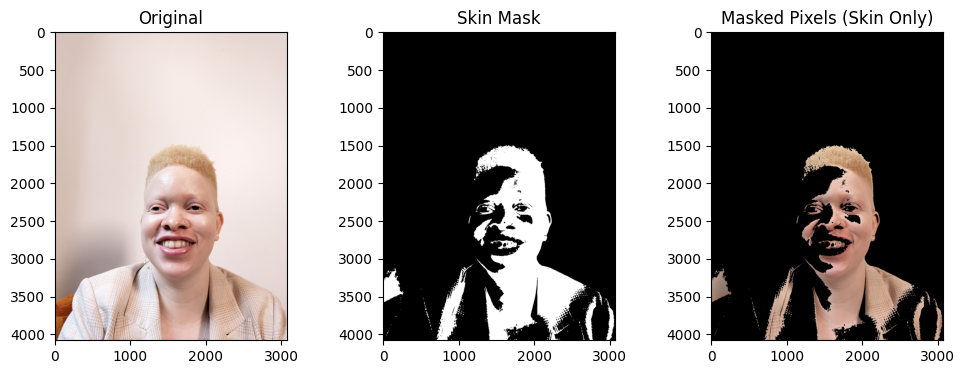

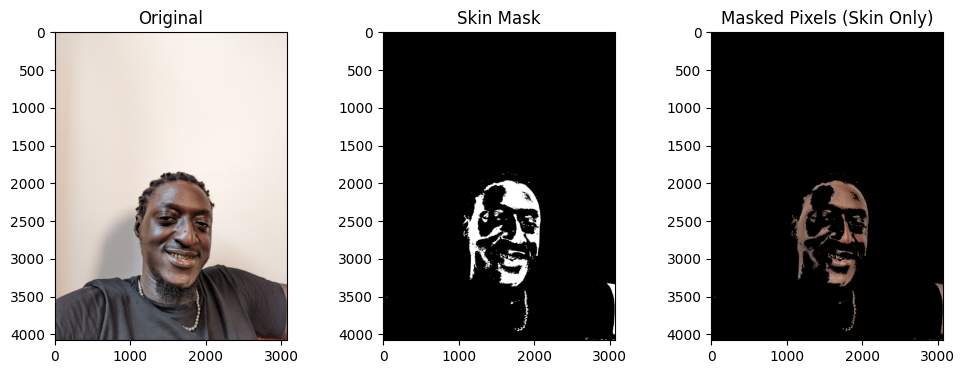

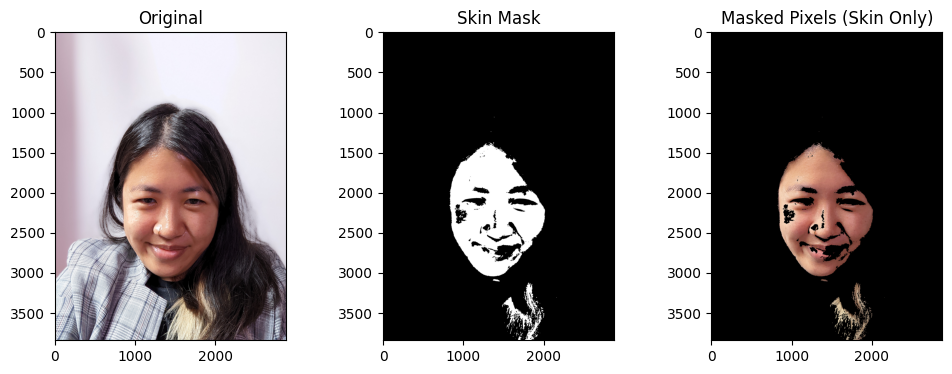

In [6]:
import matplotlib.pyplot as plt

def debug_show_mask(image_path):
    img_bgr = cv2.imread(image_path)
    mask = get_skin_mask(img_bgr)

    # Create red overlay for mask
    overlay = img_bgr.copy()
    overlay[mask == 0] = (0, 0, 0)

    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    ax[0].imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
    ax[0].set_title('Original')
    ax[1].imshow(mask, cmap='gray')
    ax[1].set_title('Skin Mask')
    ax[2].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    ax[2].set_title('Masked Pixels (Skin Only)')
    plt.show()

debug_show_mask(class_1_img)
debug_show_mask(class_10_img)
debug_show_mask(class_5_img)

### Trying Fitzpatrick Scale Given LAck of Pre-Trained MST Models

In [19]:
# pip install deepface

In [22]:
from deepface import DeepFace

def deepface_skin_tone(img_path):
    result = DeepFace.analyze(img_path, actions=["race"], enforce_detection=False)
    # DeepFace does not output Fitzpatrick directly,
    # but the "dominant_race" and probability vectors are correlated with lightness.
    # We also extract their skin_color metric if available.
    return result

def deepface_to_mst(df_output):
    race = df_output["dominant_race"]

    # Very rough proxy mapping — should calibrate empirically
    mapping = {
        "white": 1,
        "latino hispanic": 3,
        "middle eastern": 4,
        "asian": 2,
        "indian": 7,
        "black": 9
    }
    return mapping.get(race, 5)


# Example usage
class_1_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Albino.jpg'
class_10_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Black.jpg'
class_5_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\White.jpg'
print(deepface_skin_tone(class_1_img))
print(deepface_skin_tone(class_10_img))
print(deepface_skin_tone(class_5_img))

[{'race': {'asian': np.float32(79.51091), 'indian': np.float32(0.5687866), 'black': np.float32(19.83238), 'white': np.float32(0.0014755989), 'middle eastern': np.float32(2.5220688e-05), 'latino hispanic': np.float32(0.08641966)}, 'dominant_race': 'asian', 'region': {'x': 0, 'y': 42, 'w': 1055, 'h': 1229, 'left_eye': (725, 551), 'right_eye': (207, 551)}, 'face_confidence': 0.92}]
[{'race': {'asian': np.float32(0.004491722), 'indian': np.float32(0.08903784), 'black': np.float32(99.89347), 'white': np.float32(4.4132576e-05), 'middle eastern': np.float32(0.00010685223), 'latino hispanic': np.float32(0.012854456)}, 'dominant_race': 'black', 'region': {'x': 0, 'y': 0, 'w': 1287, 'h': 2016, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.0}]
[{'race': {'asian': np.float32(49.26541), 'indian': np.float32(11.885635), 'black': np.float32(19.904705), 'white': np.float32(1.9217553), 'middle eastern': np.float32(1.1012825), 'latino hispanic': np.float32(15.921207)}, 'dominant_race': 'asi

In [32]:
# ! pip install skin-tone-classifier --upgrade

NA


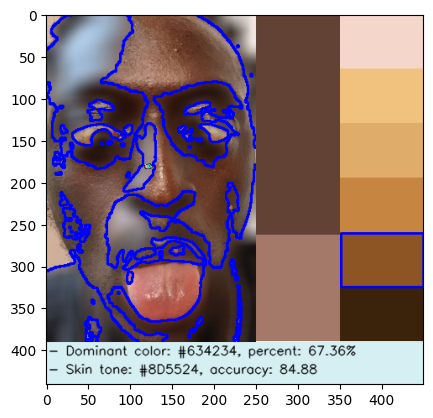

In [61]:
import stone
import matplotlib.pyplot as plt
import cv2

class_1_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Albino.jpg'
class_10_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Black.jpg'
class_10_img_2 = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\Black_2.jpg'
class_5_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\White.jpg'
# result = stone.process(class_1_img, image_type="color", return_report_image=True)

# class_1_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\MST Swatches\MST_1.png'
# class_10_img = r'C:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\DatasetAnnotation\MonkSkinToneDataset\MST Swatches\MST_10.png'

# https://skintone.google/get-started
# Monk
custom_hex_palette = [
    "#f6ede4",
    "#f3e7db",
    "#f7ead0",
    "#eadaba",
    "#d7bd96",
    "#a07e56",
    "#825c43",
    "#604134",
    "#3a312a",
    "#292420"
]
custom_labels = ["1","2","3","4","5","6","7","8","9","10"]

# Fitzpatrick
custom_hex_palette = [
    "#f5d6cb",
    "#f1c27d",
    "#e0ac69",
    "#c68642",
    "#8d5524",
    "#3a220b",
]
custom_labels = ["1","2","3","4","5","6"]


result = stone.process(
    class_10_img,
    image_type="color",
    tone_palette=custom_hex_palette,
    tone_labels=custom_labels,
    return_report_image=True,
    # threshold=0.70,       # require more skin pixels -> excludes noise
    # min_size=(150,150),   # ignore small faces
    # scale=1.05,            # finer face detection
    min_nbrs=5,
    n_dominant_colors= 2
)

# print(result)
report_images = result.pop("report_images")

print(list(report_images.keys())[0])

face_id = list(report_images.keys())[0]
plt.imshow(cv2.cvtColor(report_images[face_id], cv2.COLOR_BGR2RGB)) 

In [62]:
import numpy as np

def cheeks_only_mask(face_img):
    h, w, _ = face_img.shape
    mask = np.zeros((h, w), dtype=np.uint8)
    mask[int(h*0.45):int(h*0.75), int(w*0.20):int(w*0.45)] = 255   # left cheek
    mask[int(h*0.45):int(h*0.75), int(w*0.55):int(w*0.80)] = 255   # right cheek
    return mask


import cv2
import numpy as np
from stone.image import (
    detect_faces, mask_face,
    dominant_colors, skin_tone,
    resize
)

def classify_with_custom_roi(face_img, skin_tone_palette, tone_labels,
                             roi_mask_fn, to_bw=False, n_dominant_colors=2):

    # Generate your custom ROI mask
    mask = roi_mask_fn(face_img)

    # Apply mask to face
    skin = cv2.bitwise_and(face_img, face_img, mask=mask)

    # Extract dominant colors
    colors, pcts = dominant_colors(skin, to_bw, n_clusters=n_dominant_colors)

    # Compute skin tone
    tone_id, tone_hex, tone_label, distance = skin_tone(colors, pcts, skin_tone_palette, tone_labels)

    return {
        "dominant_colors": [
            {
                "color": "#%02X%02X%02X" % tuple(np.around([r, g, b]).astype(int)),
                "percent": round(float(p), 4)
            }
            for (b, g, r), p in zip(colors, pcts)
        ],
        "skin_tone": tone_hex,
        "tone_label": tone_label,
        "accuracy": round(100 - distance, 2)
    }


def stone_process_custom_roi(
    filename,
    roi_mask_fn=cheeks_only_mask,
    tone_palette="perla",
    tone_labels=None,
    **kwargs
):
    from stone.api import process as stone_process
    from stone.image import load_image, build_full_palette, normalize_palette, default_tone_labels

    image, basename, extension = load_image(filename)
    is_bw = False

    # Load palette
    all_pal = build_full_palette()
    if isinstance(tone_palette, str):
        skin_palette = all_pal[tone_palette]
    else:
        skin_palette = normalize_palette(tone_palette)

    # Labels
    tone_labels = tone_labels or default_tone_labels(skin_palette, "C")

    # Detect faces
    faces = detect_faces(image, scaleFactor=1.1, minNeighbors=5, minSize=(90,90))

    results = []
    for face_id, (x1,y1,x2,y2) in enumerate(faces, start=1):
        face_img = image[y1:y2, x1:x2]

        record = classify_with_custom_roi(
            face_img,
            skin_palette,
            tone_labels,
            roi_mask_fn
        )
        record["face_id"] = face_id
        results.append(record)

    return {
        "basename": basename,
        "extension": extension,
        "image_type": "color",
        "faces": results
    }

custom_hex_palette = [
    "#f6ede4",
    "#f3e7db",
    "#f7ead0",
    "#eadaba",
    "#d7bd96",
    "#a07e56",
    "#825c43",
    "#604134",
    "#3a312a",
    "#292420"
]

custom_labels = ["1","2","3","4","5","6","7","8","9","10"]

result = stone_process_custom_roi(
    class_10_img,
    roi_mask_fn=cheeks_only_mask,
    tone_palette=custom_hex_palette,
    tone_labels=custom_labels,
    return_report_image=True
)

print(result)

{'basename': 'Black', 'extension': '.jpg', 'image_type': 'color', 'faces': [{'dominant_colors': [{'color': '#B8B6BD', 'percent': 0.5088}, {'color': '#A07868', 'percent': 0.4912}], 'skin_tone': '#A07E56', 'tone_label': '6', 'accuracy': np.float64(81.74), 'face_id': 1}]}


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
from math import atan, pi
from skimage.color import rgb2lab
import mediapipe as mp
from ultralytics import YOLO

# Monk Skin Tone (MST) reference hex codes (1 to 10)
mst_palette = [
    "#f6ede4", "#f3e7db", "#f7ead0", "#eadaba", "#d7bd96",
    "#a07e56", "#825c43", "#604134", "#3a312a", "#292420"
]
mst_rgb_palette = [tuple(int(h[i:i+2], 16)/255 for i in (1, 3, 5)) for h in mst_palette]
mst_lab_palette = [rgb2lab(np.array([[rgb]])) for rgb in mst_rgb_palette]

actual_annotations = {
    'subject_0': 3, 'subject_1': 2, 'subject_2': 8, 'subject_3': 6,
    'subject_4': 9, 'subject_5': 7, 'subject_6': 5, 'subject_7': 4,
    'subject_8': 2, 'subject_9': 4, 'subject_10': 9, 'subject_11': 5,
    'subject_12': 10, 'subject_13': 2, 'subject_14': 6, 'subject_15': 3,
    'subject_16': 1, 'subject_17': 8, 'subject_18': 1
}

def compute_ita(lab):
    L, a, b = lab[0, 0]
    return atan((L - 50) / b) * 180 / pi

def find_closest_mst(lab_color):
    ita_input = compute_ita(lab_color)
    distances = [abs(ita_input - compute_ita(ref)) for ref in mst_lab_palette]
    return distances.index(min(distances)) + 1

def extract_face_skin_color(image_path, model):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    results = model([img_rgb], conf=0.001, imgsz=1280, verbose=False)
    boxes = results[0].boxes
    if boxes is None or len(boxes) == 0:
        print(f"No face detected in {image_path}")
        return None

    x1, y1, x2, y2 = map(int, boxes[0].xyxy[0].cpu().numpy())
    face_crop = img_rgb[y1:y2, x1:x2]
    if face_crop.size == 0:
        print(f"Empty face crop in {image_path}")
        return None

    mp_face = mp.solutions.face_mesh
    with mp_face.FaceMesh(static_image_mode=True, max_num_faces=1, refine_landmarks=True) as face_mesh:
        result = face_mesh.process(face_crop)
        if not result.multi_face_landmarks:
            print(f"No landmarks found in {image_path}")
            return None

        h, w, _ = face_crop.shape
        points = result.multi_face_landmarks[0].landmark
        idxs = [162, 389, 10, 109, 338]
        pixels = []

        for idx, point in enumerate(points):
            x = min(w - 1, max(0, int(point.x * w)))
            y = min(h - 1, max(0, int(point.y * h)))
            if idx in idxs:
                pixels.append(face_crop[y, x])
                cv2.circle(face_crop, (x, y), 2, (0, 255, 0), -1)  # Green for selected
            else:
                cv2.circle(face_crop, (x, y), 1, (255, 0, 0), -1)  # Blue for others
            cv2.putText(face_crop, str(idx), (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 255, 255), 1)

        mean_rgb = np.mean(pixels, axis=0) / 255
        lab = rgb2lab([[mean_rgb]])
        ita = compute_ita(lab)
        mst = find_closest_mst(lab)

        subject_id = Path(image_path).parent.name
        gt_mst = actual_annotations.get(subject_id)

        def draw_color_box(img, top_left, color_rgb, label):
            color_bgr = tuple(int(c * 255) for c in color_rgb)
            x, y = top_left
            cv2.rectangle(img, (x, y), (x + 50, y + 50), color_bgr, -1)
            cv2.rectangle(img, (x, y), (x + 50, y + 50), (0, 0, 0), 2)
            cv2.putText(img, label, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

        draw_color_box(face_crop, (0, 0), mst_rgb_palette[mst - 1], f"Pred: {mst}")
        if gt_mst:
            draw_color_box(face_crop, (60, 0), mst_rgb_palette[gt_mst - 1], f"GT: {gt_mst}")

        debug_path = image_path.replace(".jpg", "_landmarks.jpg").replace("subject_", "landmark_subject_")
        os.makedirs(os.path.dirname(debug_path), exist_ok=True)
        cv2.imwrite(debug_path, cv2.cvtColor(face_crop, cv2.COLOR_RGB2BGR))

        return {
            "r": int(mean_rgb[0] * 255),
            "g": int(mean_rgb[1] * 255),
            "b": int(mean_rgb[2] * 255),
            "l": lab[0, 0, 0],
            "a": lab[0, 0, 1],
            "b_lab": lab[0, 0, 2],
            "ita": ita,
            "mst": mst
        }

def batch_process_images(img_dir, output_csv, model_path="yolov12l-face.pt"):
    model = YOLO(model_path)
    model.fuse()
    records = []

    for path in Path(img_dir).rglob("*.jpg"):
        result = extract_face_skin_color(str(path), model)
        if result:
            result["id"] = path.name
            records.append(result)

    df = pd.DataFrame(records)
    df.to_csv(output_csv, index=False)
    print(f"Saved skin tone data for {len(df)} faces to {output_csv}")

# Example usage:
for i in range(19):
    subject = f'subject_{i}'
    print(f"Processing {subject}")
    batch_process_images(rf"MonkSkinToneDataset\mst-e_data\{subject}", rf"MonkSkinToneDataset\{subject}.csv")


#  -------------------------------------------------------------------------------------------------------------------

import glob
per_subject_preds = {}
for csv_path in glob.glob("MonkSkinToneDataset/subject_*.csv"):
    # Load and evaluate predictions
    correct = 0
    total = 0
    subject_id = Path(csv_path).stem
    df = pd.read_csv(csv_path)

    if len(df) == 0:
        print(f"[⚠️] No prediction for {subject_id}")
        continue

    # Use majority vote if multiple images per subject
    pred_label = int(df["mst"].mode().iloc[0])
    true_label = actual_annotations.get(subject_id, None)

    if true_label is not None:
        is_correct = (pred_label == true_label)
        per_subject_preds[subject_id] = (pred_label, true_label, is_correct)
        correct += int(is_correct)
        total += 1

# Accuracy summary
print(f"\n✅ Accuracy: {correct}/{total} = {correct / total:.2%}")

# Optional: Show subject-wise results
for subject, (pred, actual, match) in per_subject_preds.items():
    status = "✓" if match else "✗"
    print(f"{subject}: predicted {pred}, actual {actual} → {status}")